In [2]:
# ===== UPLOAD .xlsx file =====

import io
import pandas as pd
from google.colab import files

def upload_excel_file():
    print("Please upload an .xlsx or .xls file...")
    up = files.upload()  # user selects file(s)
    if not up:
        raise ValueError("No file uploaded.")
    # pick the first Excel file
    excel_keys = [k for k in up.keys() if k.lower().endswith((".xlsx", ".xls"))]
    if not excel_keys:
        raise ValueError("No Excel file detected. Please upload a .xlsx or .xls file.")
    fname = excel_keys[0]
    # sanity check it opens as an Excel workbook
    try:
        _ = pd.ExcelFile(io.BytesIO(up[fname]))
    except Exception as e:
        raise ValueError(f"Could not read Excel file '{fname}': {e}")
    print(f"Loaded: {fname}")
    return up

uploaded = upload_excel_file()

Please upload an .xlsx or .xls file...


Saving Raw Data (7).xlsx to Raw Data (7).xlsx
Loaded: Raw Data (7).xlsx


Please upload a hand image (png/jpg/jpeg/bmp/webp/tif).


Saving HAND.png to HAND (4).png
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1758317602.177921   49835 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1758317602.272510   49835 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1758317602.286925   49835 landmark_projection_calculator.cc:186] Using NORM_RECT without IMAGE_DIMENSIONS is only supported for the square ROI. Provide IMAGE_DIMENSIONS or use PROJECTION_MATRIX.



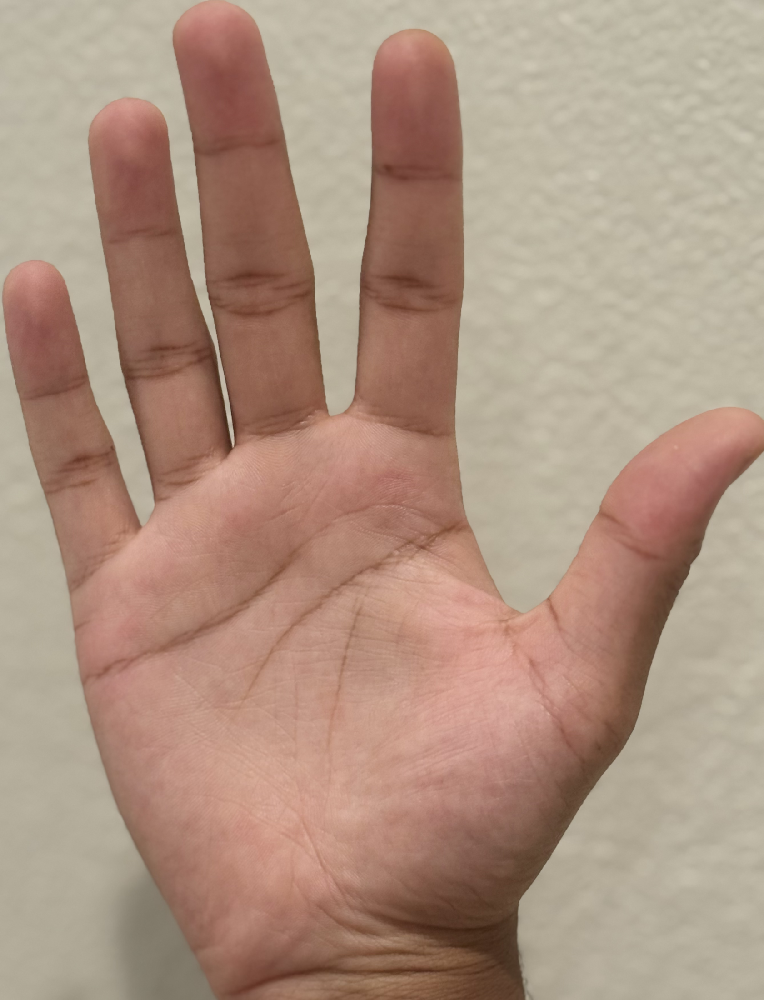

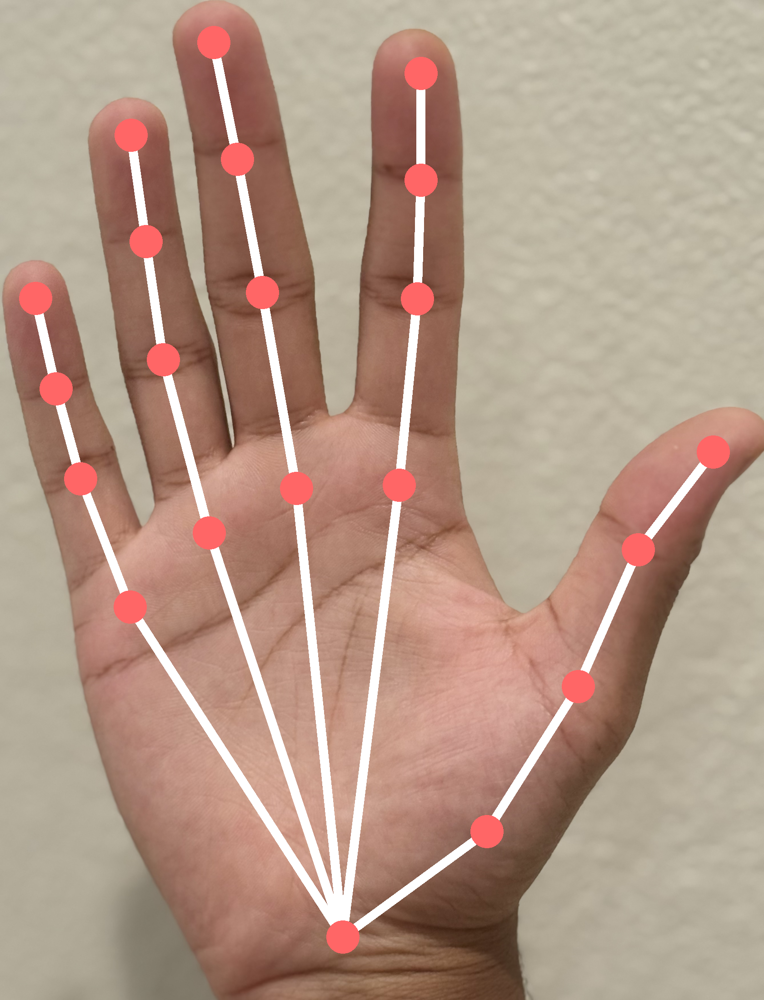

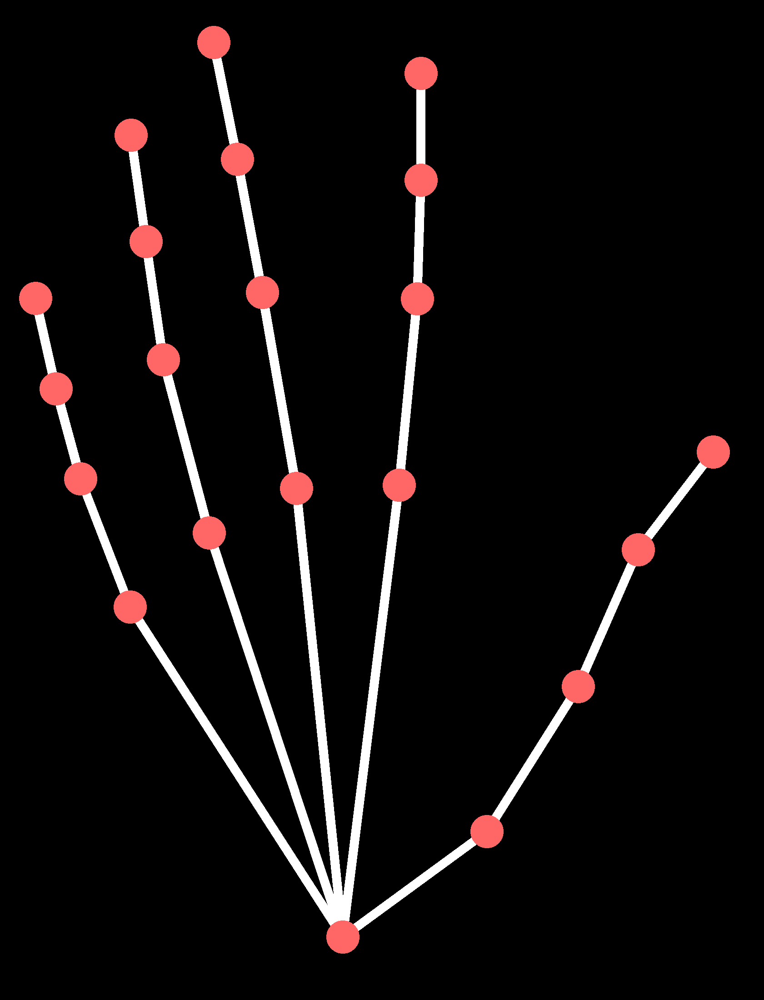


Download 600-dpi TIFFs:


Button(description='Download hand_photo.tif', layout=Layout(width='260px'), style=ButtonStyle())

Button(description='Download hand_overlay.tif', layout=Layout(width='260px'), style=ButtonStyle())

Button(description='Download hand_vector.tif', layout=Layout(width='260px'), style=ButtonStyle())

In [ ]:
# Figure 1

import os, re, io, sys, subprocess, textwrap
from IPython.display import display
from PIL import Image
import ipywidgets as widgets

# Always prompt for an image upload and save to a fixed path
import os, re, io
from google.colab import files

# Fixed paths and script name
in_path = "/content/hand_input.png"   # normalize to .png for OpenCV sanity
out_dir = "/content"
py310   = "/usr/bin/python3.10"
py310_script = "/content/hand_mediapipe_py310_backendfix.py"

print("Please upload a hand image (png/jpg/jpeg/bmp/webp/tif).")
uploaded = files.upload()

# Pick the first valid image file by extension
img_keys = [k for k in uploaded if re.search(r"\.(png|jpe?g|bmp|webp|tif?f)$", k, re.I)]
if not img_keys:
    raise ValueError("No image uploaded (or unsupported format). Please upload a PNG/JPG/BMP/WebP/TIF.")

# Save the uploaded bytes to the normalized path
with open(in_path, "wb") as f:
    f.write(uploaded[img_keys[0]])

# Write a tiny 3.10 script that forces MPLBACKEND=Agg before mediapipe imports
open(py310_script, "w").write(textwrap.dedent(r"""
import os
# Force a non-interactive backend before anything imports matplotlib
os.environ["MPLBACKEND"] = "Agg"

import sys, traceback
try:
    import cv2, numpy as np
    from PIL import Image, ImageDraw
    import mediapipe as mp

    in_path = sys.argv[1]
    out_dir = sys.argv[2]
    os.makedirs(out_dir, exist_ok=True)

    bgr = cv2.imread(in_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise RuntimeError(f"OpenCV could not decode the uploaded image at {in_path}.")
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    H, W = rgb.shape[:2]

    MAX_DIM = 2200
    if max(H, W) > MAX_DIM:
        s = MAX_DIM / float(max(H, W))
        rgb = cv2.resize(rgb, (int(W*s), int(H*s)), interpolation=cv2.INTER_AREA)
        H, W = rgb.shape[:2]

    mp_hands = mp.solutions.hands
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, model_complexity=1)
    res = hands.process(rgb)
    hands.close()

    landmarks_px = []
    if res.multi_hand_landmarks:
        for p in res.multi_hand_landmarks[0].landmark:
            landmarks_px.append((int(round(p.x * W)), int(round(p.y * H))))

    CONNECTIONS = [
        (0,1),(1,2),(2,3),(3,4),
        (0,5),(5,6),(6,7),(7,8),
        (0,9),(9,10),(10,11),(11,12),
        (0,13),(13,14),(14,15),(15,16),
        (0,17),(17,18),(18,19),(19,20)
    ]

    panel_photo   = Image.fromarray(rgb)
    panel_overlay = panel_photo.copy()
    panel_vector  = Image.new("RGB", (W, H), (0, 0, 0))

    SEG_COLOR = (255, 255, 255)
    NODE_COLOR= (255, 102, 102)
    SEG_W  = max(5, int(0.012 * min(W, H)))
    NODE_R = max(7, int(0.022 * min(W, H)))

    def draw_skeleton(draw_obj):
        for i, j in CONNECTIONS:
            if i < len(landmarks_px) and j < len(landmarks_px):
                draw_obj.line([landmarks_px[i], landmarks_px[j]], fill=SEG_COLOR, width=SEG_W)
        for (x, y) in landmarks_px:
            draw_obj.ellipse([x-NODE_R, y-NODE_R, x+NODE_R, y+NODE_R], fill=NODE_COLOR, outline=None)

    if landmarks_px:
        draw_skeleton(ImageDraw.Draw(panel_overlay))
        draw_skeleton(ImageDraw.Draw(panel_vector))

    panel_photo.save(  os.path.join(out_dir, "hand_photo.tif"),   format="TIFF", compression="tiff_lzw", dpi=(600,600))
    panel_overlay.save(os.path.join(out_dir, "hand_overlay.tif"), format="TIFF", compression="tiff_lzw", dpi=(600,600))
    panel_vector.save( os.path.join(out_dir, "hand_vector.tif"),  format="TIFF", compression="tiff_lzw", dpi=(600,600))

except Exception as e:
    print("=== PY310 SCRIPT ERROR ===")
    print(str(e))
    traceback.print_exc()
    sys.exit(1)
"""))

# Run the script with MPLBACKEND=Agg explicitly set (belt-and-suspenders)
cmd = f"MPLBACKEND=Agg {py310} {py310_script} {in_path} {out_dir}"
run = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, text=True)
print(run.stdout)
if run.returncode != 0:
    raise RuntimeError("Inner Python 3.10 step failed. See log above.")

# Show and provide download buttons
photo_tif, overlay_tif, vector_tif = [f"{out_dir}/hand_{n}.tif" for n in ("photo","overlay","vector")]
display(Image.open(photo_tif)); display(Image.open(overlay_tif)); display(Image.open(vector_tif))

import ipywidgets as widgets
from google.colab import files as gfiles

def dl(path, label):
    btn = widgets.Button(description=label, layout=widgets.Layout(width="260px"))
    btn.on_click(lambda _ : gfiles.download(path)); display(btn)

print("\nDownload 600-dpi TIFFs:")
dl(photo_tif,   "Download hand_photo.tif")
dl(overlay_tif, "Download hand_overlay.tif")
dl(vector_tif,  "Download hand_vector.tif")

Please upload the hand image (png/jpg/jpeg/bmp/webp/tif).


Saving Figure_5_Background.png to Figure_5_Background (15).png
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1758320180.369782   60442 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1758320180.404813   60442 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1758320180.419267   60441 landmark_projection_calculator.cc:186] Using NORM_RECT without IMAGE_DIMENSIONS is only supported for the square ROI. Provide IMAGE_DIMENSIONS or use PROJECTION_MATRIX.



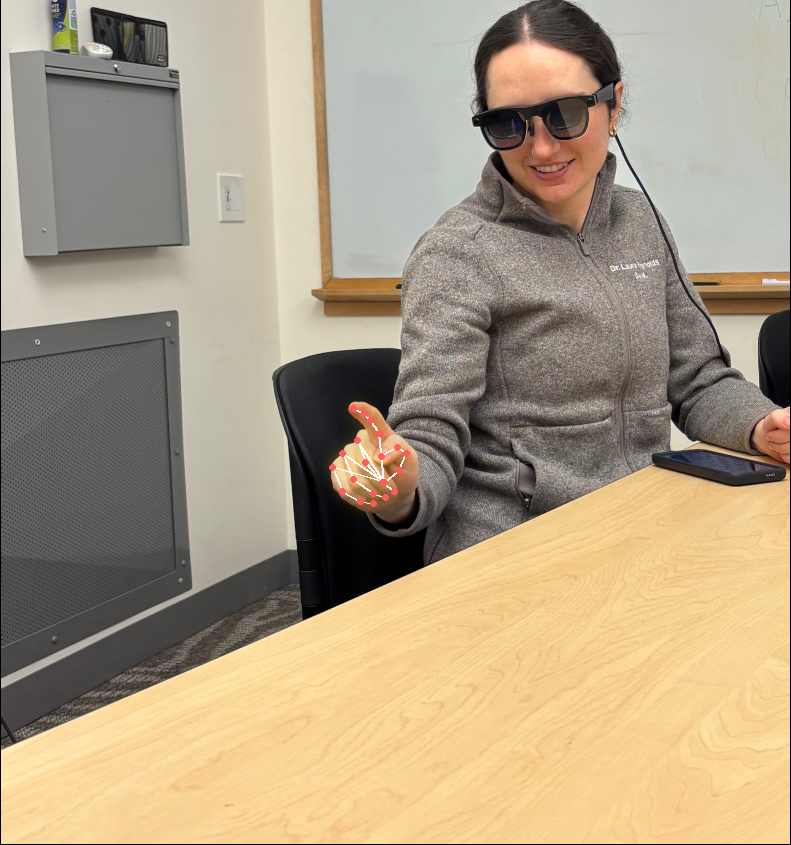

Button(description='Download 600-dpi TIFF', layout=Layout(width='280px'), style=ButtonStyle())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#Figure 4

# === Hand overlay (white vectors + red dots) with warm yellow glow (uniform halo) ===
# ---- Easy knobs you can edit ----
LINE_PX       = 2      # thickness of white lines in px (0 = auto-size)
DOT_PX        = 3      # radius of red dots in px      (0 = auto-size)
GLOW_STRENGTH = 0.05   # brightness of red/white glow (0.0–1.5)
GLOW_SPREAD   = 1      # extra outward blur (px) added to auto sizing
USE_WARM_HALO = True   # uniform warm aura around the skeleton
HALO_TINT     = (255, 220, 80)  # warm yellow (R,G,B)
HALO_ALPHA    = 85               # 0–255; lower = subtler yellow aura
# ---------------------------------

import os, re, subprocess, textwrap
from google.colab import files
from IPython.display import display
import ipywidgets as widgets
from PIL import Image as PILImage

# Prompt for image each time
print("Please upload the hand image (png/jpg/jpeg/bmp/webp/tif).")
uploaded = files.upload()
img_keys = [k for k in uploaded if re.search(r"\.(png|jpe?g|bmp|webp|tif?f)$", k, re.I)]
if not img_keys:
    raise ValueError("No image uploaded.")
in_path = "/content/hand_overlay_input.png"
with open(in_path, "wb") as f:
    f.write(uploaded[img_keys[0]])

# Python 3.10 script: MediaPipe + drawing + warm yellow halo
py310 = "/usr/bin/python3.10"
py310_script = "/content/hand_overlay_warm_halo.py"
open(py310_script, "w").write(textwrap.dedent(rf"""
import os, sys, math, traceback
os.environ["MPLBACKEND"] = "Agg"

try:
    import cv2, numpy as np
    from PIL import Image, ImageDraw, ImageFilter, ImageChops
    import mediapipe as mp

    in_path, out_dir = sys.argv[1], sys.argv[2]
    line_px  = int(sys.argv[3])
    dot_px   = int(sys.argv[4])
    glow_mul = float(sys.argv[5])
    glow_add = int(sys.argv[6])
    use_halo = (sys.argv[7].lower() == "true")
    halo_r, halo_g, halo_b = map(int, sys.argv[8].split(","))
    halo_alpha = int(sys.argv[9])
    os.makedirs(out_dir, exist_ok=True)

    # --- Load image ---
    bgr = cv2.imread(in_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise RuntimeError("Could not decode image.")
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    H, W = rgb.shape[:2]
    base = Image.fromarray(rgb).convert("RGBA")

    # --- Detect landmarks ---
    mp_hands = mp.solutions.hands
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, model_complexity=1)
    res = hands.process(rgb)
    hands.close()

    if not getattr(res, "multi_hand_landmarks", None):
        out_path = os.path.join(out_dir, "hand_with_overlay.tif")
        base.convert("RGB").save(out_path, format="TIFF", compression="tiff_lzw", dpi=(600,600))
        sys.exit(0)

    pts = [(int(round(p.x*W)), int(round(p.y*H))) for p in res.multi_hand_landmarks[0].landmark]
    CONNECTIONS = [(0,1),(1,2),(2,3),(3,4),
                   (0,5),(5,6),(6,7),(7,8),
                   (0,9),(9,10),(10,11),(11,12),
                   (0,13),(13,14),(14,15),(15,16),
                   (0,17),(17,18),(18,19),(19,20)]

    # --- Auto sizing (robust to zoom) ---
    dists=[]
    for i,j in CONNECTIONS:
        (x1,y1),(x2,y2) = pts[i], pts[j]
        d = ((x2-x1)**2 + (y2-y1)**2)**0.5
        if d>0: dists.append(d)
    ref = np.percentile(dists, 30) if dists else 0.035*min(W,H)

    SEG_W  = line_px if line_px>0 else int(round(0.32*ref))
    NODE_R = dot_px  if dot_px>0  else int(round(0.48*ref))
    SEG_W  = max(2, min(SEG_W, 14))
    NODE_R = max(3, min(NODE_R, 18))

    # --- Core overlay colors (unchanged design) ---
    LINE_SOLID = (255,255,255,240)    # white
    DOT_SOLID  = (255, 90, 90,245)    # red

    # --- Crisp overlay ---
    overlay = Image.new("RGBA", (W,H), (0,0,0,0))
    d = ImageDraw.Draw(overlay)
    for i,j in CONNECTIONS:
        d.line([pts[i], pts[j]], fill=LINE_SOLID, width=SEG_W)
    for (x,y) in pts:
        d.ellipse([x-NODE_R, y-NODE_R, x+NODE_R, y+NODE_R], fill=DOT_SOLID)

    # --- Emissive map for bloom (keeps red/white tones) ---
    emissive = Image.new("RGBA", (W,H), (0,0,0,0))
    eg = ImageDraw.Draw(emissive)
    bright_white = (255,255,255,200)
    bright_red   = (255, 90, 90,200)
    for i,j in CONNECTIONS:
        eg.line([pts[i], pts[j]], fill=bright_white, width=max(SEG_W, SEG_W+1))
    for (x,y) in pts:
        eg.ellipse([x-NODE_R, y-NODE_R, x+NODE_R, y+NODE_R], fill=bright_red)

    # Multi-pass bloom
    r_small  = max(2, int(round(0.6*max(SEG_W,NODE_R))) + glow_add//3)
    r_medium = max(4, int(round(1.2*max(SEG_W,NODE_R))) + glow_add//2)
    r_large  = max(6, int(round(2.0*max(SEG_W,NODE_R))) + glow_add)
    bloom_s  = emissive.filter(ImageFilter.GaussianBlur(radius=r_small))
    bloom_m  = emissive.filter(ImageFilter.GaussianBlur(radius=r_medium))
    bloom_l  = emissive.filter(ImageFilter.GaussianBlur(radius=r_large))

    base_rgb = base.convert("RGB")
    import PIL.ImageChops as IC
    def _screen_mix(a, b, strength):
        if strength <= 0: return a
        b = b.point(lambda v: max(0, min(255, int(v*max(0.0, min(1.5, strength))))))
        return IC.screen(a, b)

    glowed = base_rgb
    glowed = _screen_mix(glowed, bloom_l.convert("RGB"), glow_mul*0.55)
    glowed = _screen_mix(glowed, bloom_m.convert("RGB"), glow_mul*0.35)
    glowed = _screen_mix(glowed, bloom_s.convert("RGB"), glow_mul*0.25)
    glowed_rgba = glowed.convert("RGBA")

    # --- Uniform warm halo (optional) ---
    if use_halo:
        halo = Image.new("RGBA", (W,H), (0,0,0,0))
        hg = ImageDraw.Draw(halo)
        warm = (halo_r, halo_g, halo_b, halo_alpha)
        halo_line_w = SEG_W + 6
        halo_node_r = NODE_R + 6
        for i,j in CONNECTIONS:
            hg.line([pts[i], pts[j]], fill=warm, width=halo_line_w)
        for (x,y) in pts:
            hg.ellipse([x-halo_node_r, y-halo_node_r, x+halo_node_r, y+halo_node_r], fill=warm)
        halo = halo.filter(ImageFilter.GaussianBlur(radius=halo_node_r))  # strong spread
        glowed_rgba = Image.alpha_composite(glowed_rgba, halo)

    combined = Image.alpha_composite(glowed_rgba, overlay)

    out_path = os.path.join(out_dir, "hand_with_overlay.tif")
    combined.convert("RGB").save(out_path, format="TIFF", compression="tiff_lzw", dpi=(600,600))

except Exception as e:
    print("=== PY310 SCRIPT ERROR ===")
    print(e); traceback.print_exc()
    sys.exit(1)
"""))

# Run the inner script
tint_str = f"{HALO_TINT[0]},{HALO_TINT[1]},{HALO_TINT[2]}"
cmd = f"MPLBACKEND=Agg {py310} {py310_script} {in_path} /content {LINE_PX} {DOT_PX} {GLOW_STRENGTH} {GLOW_SPREAD} {USE_WARM_HALO} {tint_str} {HALO_ALPHA}"
run = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, text=True)
print(run.stdout)
if run.returncode != 0:
    raise RuntimeError("Inner Python 3.10 step failed. See log above.")

# Preview + download
tif_path = "/content/hand_with_overlay.tif"
display(PILImage.open(tif_path))

def dl(path, label):
    btn = widgets.Button(description=label, layout=widgets.Layout(width="280px"))
    btn.on_click(lambda _ : files.download(path))
    display(btn)

dl(tif_path, "Download 600-dpi TIFF")

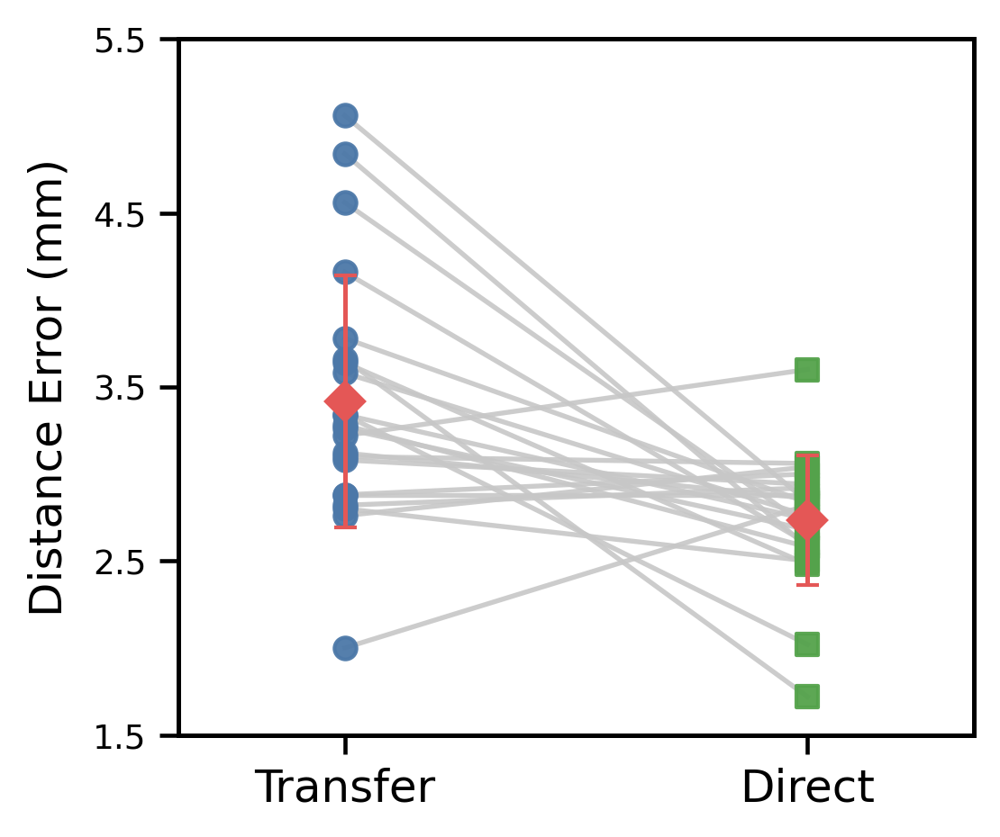

Button(description='Download 600 dpi TIFF', layout=Layout(width='230px'), style=ButtonStyle())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# FIGURE 6B

# Updates:
# - Y-axis fixed 1.5 → 5.5
# - Ticks every 1 unit (1.5, 2.5, 3.5, 4.5, 5.5) with tenths place labels
# - Connector linewidth = 1.3
# - Y-axis label font size = 9
# - Arial font, compact layout
# - 600 dpi TIFF download button

import io, re, os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib import rcParams

# -------- Colab helpers --------
try:
    from google.colab import files
    import ipywidgets as widgets
    _IS_COLAB = True
except Exception:
    _IS_COLAB = False

# =================== STYLE ===================
rcParams.clear()
rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "DejaVu Sans"],
    "axes.linewidth": 1.2,
    "xtick.major.size": 5, "ytick.major.size": 5,
    "xtick.major.width": 1.1, "ytick.major.width": 1.1,
})
FIG_SIZE = (3.6, 3.0)
DPI_PNG  = 300
DPI_TIF  = 600

OUT_DIR  = "/content"
PNG_PATH = os.path.join(OUT_DIR, "AvgDistance_Transfer_vs_Direct_range1p5-5p5.png")
TIF_PATH = os.path.join(OUT_DIR, "AvgDistance_Transfer_vs_Direct_range1p5-5p5_600dpi.tif")

# Colors
COL_TRANSFER = "#4C78A8"   # blue circles
COL_DIRECT   = "#54A24B"   # green squares
COL_PAIR     = (0.78, 0.78, 0.78)  # grey connectors
COL_DIAMOND  = "#E45756"   # red mean±SD diamond

# Category spacing
INSET = 0.18
xT, xD = 0.0 + INSET, 1.0 - INSET

# =================== LOAD & PARSE COORDINATES ===================
if "uploaded" not in globals() or not len(uploaded):
    raise RuntimeError("No uploaded workbook found. Re-run the upload cell to populate `uploaded`.")

xlsx_name, xlsx_bytes = next(iter(uploaded.items()))
xls = pd.ExcelFile(io.BytesIO(xlsx_bytes))
coord_sheet = next(s for s in xls.sheet_names if "coord" in s.strip().lower())
dfc_raw = pd.read_excel(io.BytesIO(xlsx_bytes), sheet_name=coord_sheet, header=None)

def _trim_empty_edges(df):
    df = df.loc[:, ~df.isna().all(axis=0)]
    df = df.loc[~df.isna().all(axis=1)]
    return df.reset_index(drop=True)

df = _trim_empty_edges(dfc_raw)

def find_pid_col(d):
    for c in d.columns:
        if isinstance(c, str) and re.search(r"participant\s*id|^id$", c, re.I):
            return c
    return d.columns[0]

# set columns
if df.iloc[0].notna().sum() >= max(3, int(df.shape[1]*0.3)):
    df.columns = df.iloc[0].astype(str).tolist()
else:
    df.columns = [str(c) for c in df.columns]

# locate label row with "(mm)"
label_row_idx = None
for r in range(min(6, len(df))):
    row = df.iloc[r].astype(str)
    if row.str.contains(r"\(mm\)", case=False, regex=True).any():
        label_row_idx = r
        break
if label_row_idx is None:
    raise RuntimeError("Could not find a '(mm)' label row in the Coordinates sheet.")

subhdr  = df.iloc[label_row_idx]
cols    = list(df.columns)
pid_col = find_pid_col(df)
data_rows = df.index[df.index > label_row_idx]

def mm_label_positions(k):
    pat = rf"^\s*{k}\s*\(mm\)\s*$|^\s*{k}\s*mm\s*$"
    return [j for j, v in enumerate(subhdr.astype(str)) if re.search(pat, v.strip(), re.I)]

def find_mm_runs():
    idx_lists = [mm_label_positions(k) for k in range(1, 6)]
    runs = []
    for i1 in idx_lists[0]:
        prev = i1; chain = [i1]; ok = True
        for k in range(1, 5):
            cand = [j for j in idx_lists[k] if j > prev]
            if not cand: ok = False; break
            nxt = cand[0]; chain.append(nxt); prev = nxt
        if ok and len(chain) == 5: runs.append(chain)
    return runs

runs = find_mm_runs()
if len(runs) < 2:
    raise RuntimeError("Need two 1..5 (mm) runs (first=Transfer, second=Direct).")
run_T, run_D = runs[0], runs[1]
T_cols = [cols[j] for j in run_T]
D_cols = [cols[j] for j in run_D]

def extract_attempts(block_cols, label):
    use_cols = [pid_col] + [c for c in block_cols if c in df.columns]
    sub = df.loc[data_rows, use_cols].copy()
    sub[pid_col] = pd.to_numeric(sub[pid_col], errors="coerce").astype("Int64")
    sub = sub.dropna(subset=[pid_col])
    for c in block_cols:
        if c in sub.columns:
            sub[c] = pd.to_numeric(sub[c], errors="coerce")
    out = {}
    for k, c in enumerate(block_cols, start=1):
        if c in sub.columns:
            s = sub.set_index(pid_col)[c]
            s.name = f"{label}_{k}_mm"
            out[k] = s
    return out

series_T = extract_attempts(T_cols, "Transfer")
series_D = extract_attempts(D_cols, "Direct")

# =================== PER-PERSON AVERAGES ===================
all_pids = set()
for k in range(1, 6):
    if series_T.get(k) is not None: all_pids |= set(series_T[k].index.dropna().tolist())
    if series_D.get(k) is not None: all_pids |= set(series_D[k].index.dropna().tolist())

def mean_for(pid, series_dict):
    vals = []
    for k in range(1, 6):
        s = series_dict.get(k)
        if s is not None and pid in s.index and pd.notna(s.loc[pid]):
            vals.append(float(s.loc[pid]))
    return (np.mean(vals) if len(vals) else np.nan)

rows = []
for pid in sorted(all_pids):
    t_mean = mean_for(pid, series_T)
    d_mean = mean_for(pid, series_D)
    if not (np.isnan(t_mean) and np.isnan(d_mean)):
        rows.append((pid, t_mean, d_mean))
df_avg = pd.DataFrame(rows, columns=["PID", "Transfer_mean_mm", "Direct_mean_mm"]).dropna()

# =================== PLOT ===================
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=DPI_PNG)

t_vals = df_avg["Transfer_mean_mm"].to_numpy(float)
d_vals = df_avg["Direct_mean_mm"].to_numpy(float)

# Connectors (linewidth=1.3)
for t, d in zip(t_vals, d_vals):
    if np.isfinite(t) and np.isfinite(d):
        ax.plot([xT, xD], [t, d], color=COL_PAIR, linewidth=1.3, alpha=0.9, zorder=1)

# Points
ax.scatter(np.full_like(t_vals, xT), t_vals, s=34, marker="o", color=COL_TRANSFER, alpha=0.95, zorder=3)
ax.scatter(np.full_like(d_vals, xD), d_vals, s=34, marker="s", color=COL_DIRECT,   alpha=0.95, zorder=3)

# Mean ± SD (diamond)
def mean_sd_diamond(ax, x, arr, color=COL_DIAMOND):
    arr = np.asarray(arr, float); arr = arr[np.isfinite(arr)]
    if arr.size == 0: return
    m = float(np.mean(arr)); sd = float(np.std(arr, ddof=1)) if arr.size > 1 else 0.0
    ax.errorbar([x], [m], yerr=[[sd],[sd]], fmt="D", ms=7, color=color,
                ecolor=color, elinewidth=1.2, capsize=3, lw=1.2, zorder=5)

mean_sd_diamond(ax, xT, t_vals)
mean_sd_diamond(ax, xD, d_vals)

# Y-axis fixed 1.5–5.5, ticks every 1
ax.set_ylim(1.5, 5.5)
yticks = np.arange(1.5, 5.6, 1.0)   # [1.5, 2.5, 3.5, 4.5, 5.5]
ax.set_yticks(yticks)
ax.set_yticklabels([f"{y:.1f}" for y in yticks], fontsize=9)

# Category axis
ax.set_xlim(-0.05, 1.05)
ax.set_xticks([xT, xD])
ax.set_xticklabels(["Transfer", "Direct"], fontsize=12)
ax.set_ylabel("Distance Error (mm)", fontsize=12, labelpad=6)

# All spines visible
for side in ["top", "right", "left", "bottom"]:
    ax.spines[side].set_visible(True)

fig.tight_layout(pad=0.35)

# =================== SAVE + 600 dpi TIFF DOWNLOAD ===================
fig.savefig(PNG_PATH, dpi=DPI_PNG, bbox_inches="tight")
fig.savefig(TIF_PATH, dpi=DPI_TIF, bbox_inches="tight",
            pil_kwargs={"compression": "tiff_lzw"})
plt.show()

if _IS_COLAB:
    btn = widgets.Button(description="Download 600 dpi TIFF", button_style="",
                         layout=widgets.Layout(width="230px"))
    def _on_click(_): files.download(TIF_PATH)
    btn.on_click(_on_click)
    display(btn)

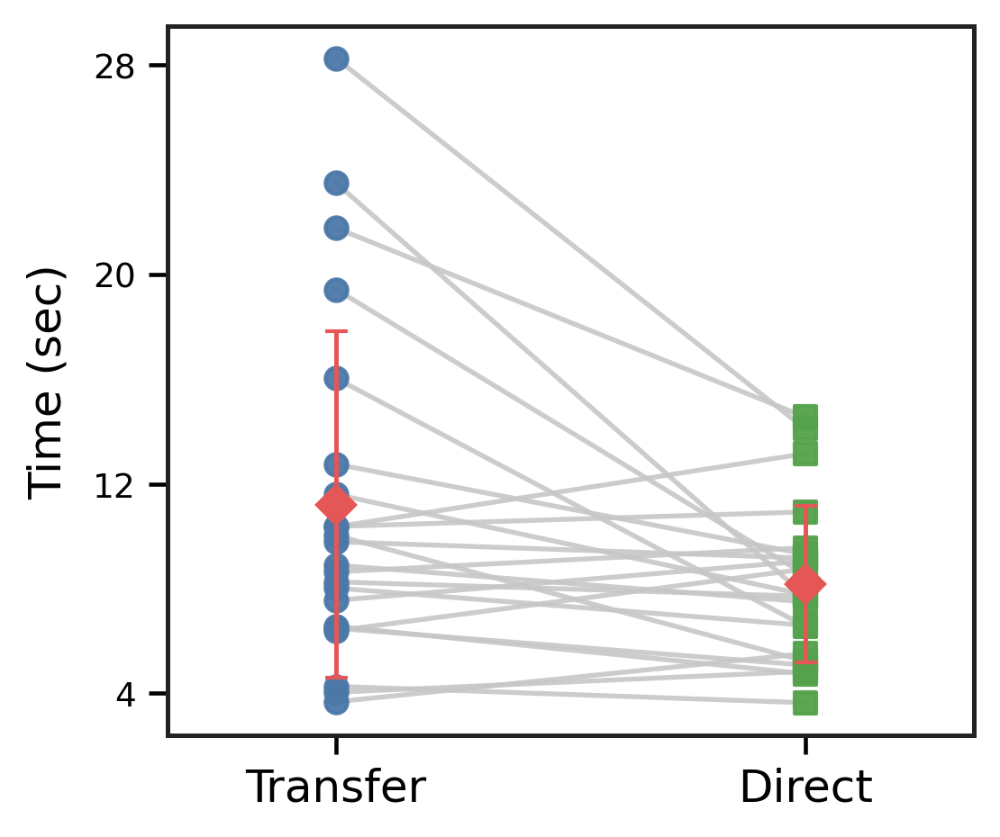

Button(description='Download 600 dpi TIFF', layout=Layout(width='230px'), style=ButtonStyle())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# FIGURE 6C

# Updates:
# - Y-axis ticks fixed at [4, 12, 20, 28]
# - Y-axis tick labels are integers (no decimals)
# - Y-axis tick font size = 9
# - All fonts Arial (fallback to DejaVu Sans if Arial not installed)
# - Connector linewidth = 1.3
# - Compact layout
# - 600 dpi TIFF download button

import io, re, os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib import rcParams

# -------- Colab helpers --------
try:
    from google.colab import files
    import ipywidgets as widgets
    _IS_COLAB = True
except Exception:
    _IS_COLAB = False

# =================== STYLE ===================
rcParams.clear()
rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "DejaVu Sans"],  # Arial if available, otherwise fallback
    "axes.linewidth": 1.2,
    "xtick.major.size": 5, "ytick.major.size": 5,
    "xtick.major.width": 1.1, "ytick.major.width": 1.1,
})
FIG_SIZE = (3.6, 3.0)
DPI_PNG  = 300
DPI_TIF  = 600

OUT_DIR  = "/content"
PNG_PATH = os.path.join(OUT_DIR, "AvgTime_Transfer_vs_Direct_yTicks4-28.png")
TIF_PATH = os.path.join(OUT_DIR, "AvgTime_Transfer_vs_Direct_yTicks4-28_600dpi.tif")

# Colors
COL_TRANSFER = "#4C78A8"   # blue circles
COL_DIRECT   = "#54A24B"   # green squares
COL_PAIR     = (0.78, 0.78, 0.78)  # grey connectors
COL_DIAMOND  = "#E45756"   # red mean±SD diamond

# Category spacing
INSET = 0.18
xT, xD = 0.0 + INSET, 1.0 - INSET

# =================== LOAD & PARSE (sec) COLUMNS ===================
if "uploaded" not in globals() or not len(uploaded):
    raise RuntimeError("No uploaded workbook found. Re-run the upload cell to populate `uploaded`.")

xlsx_name, xlsx_bytes = next(iter(uploaded.items()))
xls = pd.ExcelFile(io.BytesIO(xlsx_bytes))
coord_sheet = next(s for s in xls.sheet_names if "coord" in s.strip().lower())
dfc_raw = pd.read_excel(io.BytesIO(xlsx_bytes), sheet_name=coord_sheet, header=None)

def _trim_empty_edges(df):
    df = df.loc[:, ~df.isna().all(axis=0)]
    df = df.loc[~df.isna().all(axis=1)]
    return df.reset_index(drop=True)

df = _trim_empty_edges(dfc_raw)

def find_pid_col(d):
    for c in d.columns:
        if isinstance(c, str) and re.search(r"participant\s*id|^id$", c, re.I):
            return c
    return d.columns[0]

# set columns
if df.iloc[0].notna().sum() >= max(3, int(df.shape[1]*0.3)):
    df.columns = df.iloc[0].astype(str).tolist()
else:
    df.columns = [str(c) for c in df.columns]

# locate label row with "(sec)"
label_row_idx = None
for r in range(min(6, len(df))):
    row = df.iloc[r].astype(str)
    if row.str.contains(r"\(sec\)", case=False, regex=True).any():
        label_row_idx = r
        break
if label_row_idx is None:
    raise RuntimeError("Could not find a '(sec)' label row in the Coordinates sheet.")

subhdr  = df.iloc[label_row_idx]
cols    = list(df.columns)
pid_col = find_pid_col(df)
data_rows = df.index[df.index > label_row_idx]

def sec_label_positions(k):
    pat = rf"^\s*{k}\s*\(sec\)\s*$|^\s*{k}\s*sec\s*$"
    return [j for j, v in enumerate(subhdr.astype(str)) if re.search(pat, v.strip(), re.I)]

def find_sec_runs():
    idx_lists = [sec_label_positions(k) for k in range(1, 6)]
    runs = []
    for i1 in idx_lists[0]:
        prev = i1; chain = [i1]; ok = True
        for k in range(1, 5):
            cand = [j for j in idx_lists[k] if j > prev]
            if not cand: ok = False; break
            nxt = cand[0]; chain.append(nxt); prev = nxt
        if ok and len(chain) == 5: runs.append(chain)
    return runs

runs = find_sec_runs()
if len(runs) < 2:
    raise RuntimeError("Need two 1..5 (sec) runs (first=Transfer, second=Direct).")
run_T, run_D = runs[0], runs[1]
T_cols = [cols[j] for j in run_T]
D_cols = [cols[j] for j in run_D]

def extract_attempts(block_cols, label):
    use_cols = [pid_col] + [c for c in block_cols if c in df.columns]
    sub = df.loc[data_rows, use_cols].copy()
    sub[pid_col] = pd.to_numeric(sub[pid_col], errors="coerce").astype("Int64")
    sub = sub.dropna(subset=[pid_col])
    for c in block_cols:
        if c in sub.columns:
            sub[c] = pd.to_numeric(sub[c], errors="coerce")
    out = {}
    for k, c in enumerate(block_cols, start=1):
        if c in sub.columns:
            s = sub.set_index(pid_col)[c]
            s.name = f"{label}_{k}_sec"
            out[k] = s
    return out

series_T = extract_attempts(T_cols, "Transfer")
series_D = extract_attempts(D_cols, "Direct")

# =================== PER-PERSON AVERAGES ===================
all_pids = set()
for k in range(1, 6):
    if series_T.get(k) is not None: all_pids |= set(series_T[k].index.dropna().tolist())
    if series_D.get(k) is not None: all_pids |= set(series_D[k].index.dropna().tolist())

def mean_for(pid, series_dict):
    vals = []
    for k in range(1, 6):
        s = series_dict.get(k)
        if s is not None and pid in s.index and pd.notna(s.loc[pid]):
            vals.append(float(s.loc[pid]))
    return (np.mean(vals) if len(vals) else np.nan)

rows = []
for pid in sorted(all_pids):
    t_mean = mean_for(pid, series_T)
    d_mean = mean_for(pid, series_D)
    if not (np.isnan(t_mean) and np.isnan(d_mean)):
        rows.append((pid, t_mean, d_mean))
df_avg = pd.DataFrame(rows, columns=["PID", "Transfer_mean_sec", "Direct_mean_sec"]).dropna()

# =================== PLOT ===================
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=DPI_PNG)

t_vals = df_avg["Transfer_mean_sec"].to_numpy(float)
d_vals = df_avg["Direct_mean_sec"].to_numpy(float)

# Connectors (linewidth=1.3)
for t, d in zip(t_vals, d_vals):
    if np.isfinite(t) and np.isfinite(d):
        ax.plot([xT, xD], [t, d], color=COL_PAIR, linewidth=1.3, alpha=0.9, zorder=1)

# Points
ax.scatter(np.full_like(t_vals, xT), t_vals, s=34, marker="o", color=COL_TRANSFER, alpha=0.95, zorder=3)
ax.scatter(np.full_like(d_vals, xD), d_vals, s=34, marker="s", color=COL_DIRECT,   alpha=0.95, zorder=3)

# Mean ± SD (diamond)
def mean_sd_diamond(ax, x, arr, color=COL_DIAMOND):
    arr = np.asarray(arr, float); arr = arr[np.isfinite(arr)]
    if arr.size == 0: return
    m = float(np.mean(arr)); sd = float(np.std(arr, ddof=1)) if arr.size > 1 else 0.0
    ax.errorbar([x], [m], yerr=[[sd],[sd]], fmt="D", ms=7, color=color,
                ecolor=color, elinewidth=1.2, capsize=3, lw=1.2, zorder=5)

mean_sd_diamond(ax, xT, t_vals)
mean_sd_diamond(ax, xD, d_vals)

# --------- Y-axis: fixed ticks at 4, 12, 20, 28 ---------
ax.set_yticks([4, 12, 20, 28])
ax.set_yticklabels([str(y) for y in [4, 12, 20, 28]], fontsize=9)

# Category axis
ax.set_xlim(-0.05, 1.05)
ax.set_xticks([xT, xD])
ax.set_xticklabels(["Transfer", "Direct"], fontsize=12)
ax.set_ylabel("Time (sec)", fontsize=12, labelpad=6)

# All spines visible
for side in ["top", "right", "left", "bottom"]:
    ax.spines[side].set_visible(True)

fig.tight_layout(pad=0.35)

# =================== SAVE + 600 dpi TIFF DOWNLOAD ===================
fig.savefig(PNG_PATH, dpi=DPI_PNG, bbox_inches="tight")
fig.savefig(TIF_PATH, dpi=DPI_TIF, bbox_inches="tight",
            pil_kwargs={"compression": "tiff_lzw"})
plt.show()

if _IS_COLAB:
    btn = widgets.Button(description="Download 600 dpi TIFF", button_style="",
                         layout=widgets.Layout(width="230px"))
    def _on_click(_): files.download(TIF_PATH)
    btn.on_click(_on_click)
    display(btn)

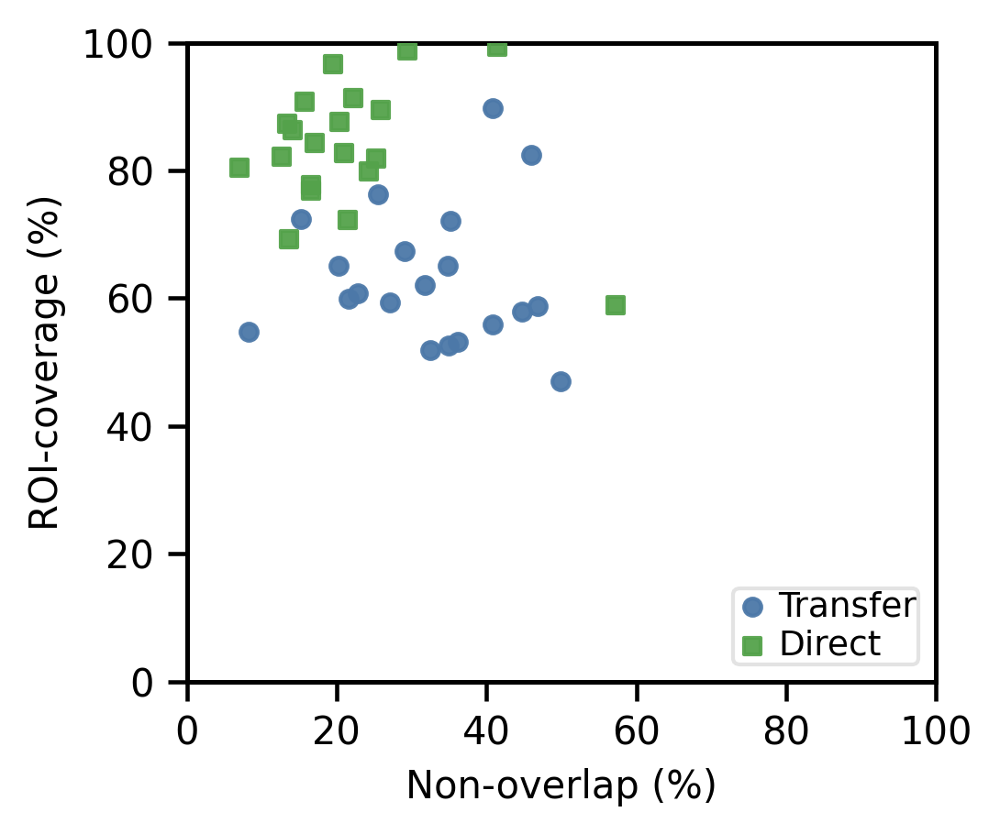

Saved: /content/Figure_NO_vs_ROI_avgROI1-3.png
Saved: /content/Figure_NO_vs_ROI_avgROI1-3_600dpi.tif


Button(description='Download 600 dpi TIFF', style=ButtonStyle())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# FIGURE 7B

# x = Non-overlap (%), y = ROI-coverage (%), colored by condition (Transfer vs Direct)
# - Parses ROI sheet from `uploaded`
# - Averages per participant across ROI 1–3
# - Displays figure once
# - Saves PNG (300 dpi) and TIFF (600 dpi, LZW)
# - Renders a "Download 600 dpi TIFF" button (no auto-download)

import io, re, os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy import stats
from IPython.display import display

# Force all figure text to use Arial (Liberation Sans as fallback if Arial unavailable)
rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "Liberation Sans"]
})

# Colab-specific imports
try:
    from google.colab import files
    import ipywidgets as widgets
    _IS_COLAB = True
except Exception:
    _IS_COLAB = False

# ===== CONFIG =====
FIG_SIZE    = (3.6, 3.0)     # single-panel size in inches
DPI_PNG     = 300
DPI_TIF     = 600
OUT_DIR     = "/content"
PNG_PATH    = os.path.join(OUT_DIR, "Figure_NO_vs_ROI_avgROI1-3.png")
TIF_PATH    = os.path.join(OUT_DIR, "Figure_NO_vs_ROI_avgROI1-3_600dpi.tif")
ROIS_USE    = [1, 2, 3]

# Colors (fallbacks if not defined upstream)
COL_TRANSFER = globals().get("COL_TRANSFER", "#4C78A8")  # blue
COL_DIRECT   = globals().get("COL_DIRECT",   "#54A24B")  # green

# Uniform figure font (Arial preferred by journals for figure text)
rcParams["font.family"]     = "sans-serif"
rcParams["font.sans-serif"] = ["Arial", "Helvetica", "DejaVu Sans"]

# ---------- Load ROI tab ----------
if "uploaded" not in globals() or not len(uploaded):
    raise RuntimeError("No uploaded workbook found. Re-run the upload cell to populate `uploaded`.")

xlsx_name, xlsx_bytes = next(iter(uploaded.items()))
xls = pd.ExcelFile(io.BytesIO(xlsx_bytes))
roi_sheet = next((s for s in xls.sheet_names if "roi" in s.strip().lower()), None)
if roi_sheet is None:
    raise RuntimeError("Could not find a sheet with 'ROI' in its name.")

df = pd.read_excel(io.BytesIO(xlsx_bytes), sheet_name=roi_sheet, header=[0,1])

# ---------- Identify participant column ----------
pid_candidates = [c for c in df.columns
                  if isinstance(c[0], str) and c[0].strip().lower().startswith("participant")]
if not pid_candidates:
    raise RuntimeError("Participant ID column not found on ROI sheet.")
pid_col = pid_candidates[0]

df_part = df[~df[pid_col].isna()].copy()
df_part[pid_col] = pd.to_numeric(df_part[pid_col], errors="coerce").astype("Int64")

# ---------- Extract blocks (Transfer/Test vs Direct/Control) into tidy ----------
def extract_block(block_name):
    recs = []
    roi_indices = sorted({int(m.group(1)) for top, sub in df.columns
                          if top == block_name and (m:=re.search(r"#\s*(\d+)", str(sub)))})
    for roi in roi_indices:
        cols = [c for c in df.columns if c[0]==block_name and re.search(fr"#\s*{roi}(?:\.|$)", str(c[1]))]
        def col_key(c):
            m = re.search(fr"#\s*{roi}(?:\.(\d+))?$", str(c[1]))
            return int(m.group(1)) if (m and m.group(1) is not None) else -1
        cols_sorted = sorted(cols, key=col_key)

        # infer labels
        label_row = None
        for i in range(3):
            r = df.iloc[i][cols_sorted]
            if r.astype(str).str.contains("N-O|O %|ROI %|Time", case=False, regex=True).any():
                label_row = r.astype(str).tolist(); break
        if label_row is None:
            label_row = [str(c[1]) for c in cols_sorted]

        def norm(v):
            v = v.strip()
            rep = {"N-O area":"NO_area","O area":"O_area","ROI area":"ROI_area",
                   "Time (s)":"Time_s","N-O %":"NO_pct","O %":"O_pct","ROI %":"ROI_pct"}
            if v in rep: return rep[v]
            v2 = v.lower().replace(" ", "")
            if v2 in ["n-o%","no%"]: return "NO_pct"
            if v2 == "o%":           return "O_pct"
            if v2 == "roi%":         return "ROI_pct"
            if "time" in v2 and "s" in v2: return "Time_s"
            return v

        key_map = dict(zip(cols_sorted, [norm(v) for v in label_row]))
        sub = df_part[[pid_col] + cols_sorted].copy()

        for _, row in sub.iterrows():
            rec = {"ParticipantID": int(row[pid_col]), "ROI": roi,
                   "Condition": "Transfer" if "Test" in block_name else "Direct"}
            for col in cols_sorted:
                k = key_map[col]
                try:
                    rec[k] = float(row[col])
                except Exception:
                    rec[k] = np.nan
            recs.append(rec)
    return pd.DataFrame.from_records(recs)

transfer = extract_block("Test ROI")
direct   = extract_block("Control ROI")
tidy = pd.concat([transfer, direct], ignore_index=True)

# Convert fractional percentages to 0–100 if needed
for col in ["NO_pct","ROI_pct"]:
    if col in tidy and tidy[col].dropna().between(0,1).mean() > 0.5:
        tidy[col] = tidy[col]*100.0

# ---------- Average across ROI 1–3 per participant × condition ----------
df_roi13 = tidy[tidy["ROI"].isin(ROIS_USE)].copy()

# Use provided `common_ids` if present, otherwise derive from rows with both axes present
if "common_ids" in globals() and len(common_ids):
    df_roi13 = df_roi13[df_roi13["ParticipantID"].isin(common_ids)]

# Aggregate: mean across ROI 1–3 for each ParticipantID × Condition
avg = (df_roi13
       .groupby(["ParticipantID", "Condition"], as_index=False)
       .agg({"NO_pct":"mean", "ROI_pct":"mean"}))

# Keep participants with at least one condition present
# (optional) require both conditions for paired view:
# ids_both = avg.groupby("ParticipantID")["Condition"].nunique()
# avg = avg[avg["ParticipantID"].isin(ids_both[ids_both==2].index)]

# ---------- Plot single scatter ----------
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=DPI_PNG)

def add_scatter(ax, df_cond, label, marker, color):
    dfc = df_cond.dropna(subset=["NO_pct","ROI_pct"])
    if dfc.empty:
        return
    ax.scatter(dfc["NO_pct"], dfc["ROI_pct"], s=20, marker=marker, alpha=0.95,
               color=color, label=label, zorder=3)

add_scatter(ax, avg[avg["Condition"]=="Transfer"], "Transfer", "o", COL_TRANSFER)
add_scatter(ax, avg[avg["Condition"]=="Direct"],   "Direct",   "s", COL_DIRECT)

ax.set_xlabel("Non-overlap (%)")
ax.set_ylabel("ROI-coverage (%)")
ax.set_xlim(0, 100); ax.set_xticks(np.arange(0, 101, 20))
ax.set_ylim(0, 100); ax.set_yticks(np.arange(0, 101, 20))
ax.grid(False)

# Legend inside plot (lower-right)
ax.legend(loc="lower right",
          frameon=True, framealpha=0.55, fontsize=9,
          borderpad=0.06, handletextpad=0.25,
          labelspacing=0.18, handlelength=1.0, columnspacing=0.5)

fig.tight_layout(pad=0.6)
plt.show()  # show once

# ---- SAVE FILES ----
fig.savefig(PNG_PATH, dpi=DPI_PNG, bbox_inches="tight")
fig.savefig(TIF_PATH, dpi=DPI_TIF, bbox_inches="tight",
            pil_kwargs={"compression": "tiff_lzw"})

print(f"Saved: {PNG_PATH}\nSaved: {TIF_PATH}")

# ---- DOWNLOAD BUTTON (manual click) ----
if _IS_COLAB:
    btn = widgets.Button(description="Download 600 dpi TIFF", button_style="")
    def _on_click(_):
        files.download(TIF_PATH)
    btn.on_click(_on_click)
    display(btn)

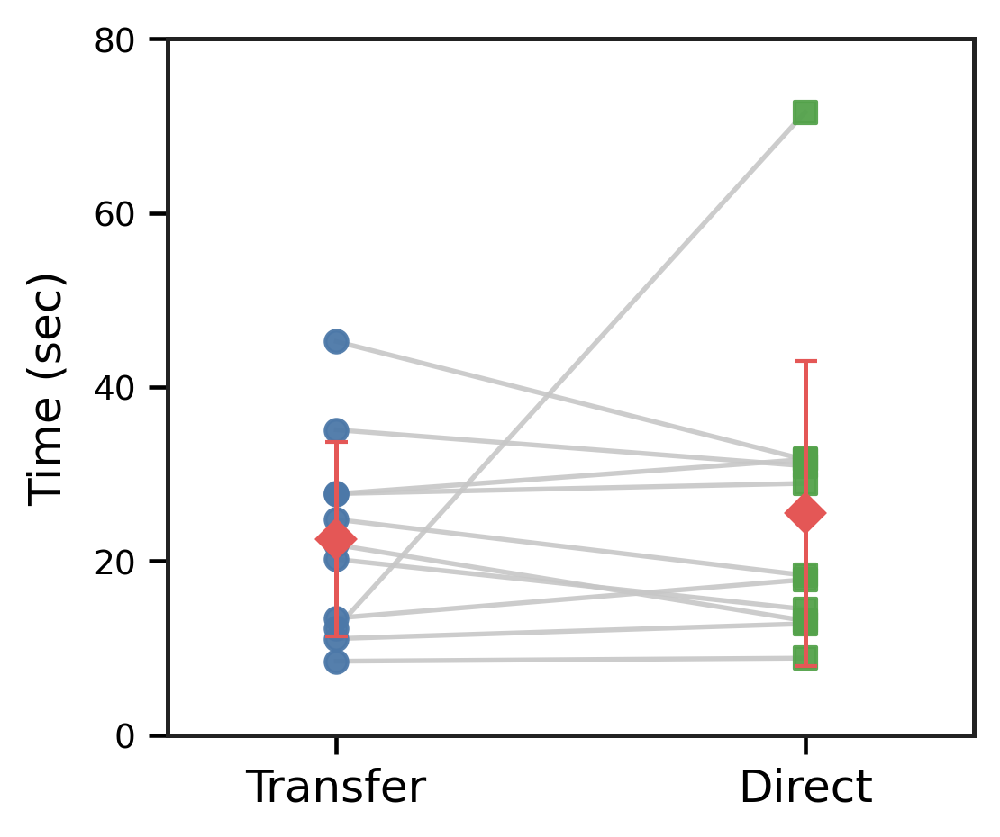

Button(description='Download 600 dpi TIFF', layout=Layout(width='230px'), style=ButtonStyle())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# FIGURE 7C

# - Robust to merged/multi-row headers (ffill down/across; combine header rows)
# - Detects exactly 6 "Time (s)" columns; first 3 = Transfer, last 3 = Direct
# - Smart y-axis ticks using a 1–2–5 "nice numbers" algorithm (balanced range)
# - Integer tick labels, size=9; Arial (fallback to DejaVu Sans)
# - Connector linewidth=1.3; mean±SD diamonds; 600 dpi TIFF button

import io, re, os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.ticker import FormatStrFormatter

# -------- Colab helpers --------
try:
    from google.colab import files
    import ipywidgets as widgets
    _IS_COLAB = True
except Exception:
    _IS_COLAB = False

# =================== STYLE ===================
rcParams.clear()
rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "DejaVu Sans"],  # Arial if present, else DejaVu Sans
    "axes.linewidth": 1.2,
    "xtick.major.size": 5, "ytick.major.size": 5,
    "xtick.major.width": 1.1, "ytick.major.width": 1.1,
})
FIG_SIZE = (3.6, 3.0)
DPI_PNG  = 300
DPI_TIF  = 600

OUT_DIR  = "/content"
PNG_PATH = os.path.join(OUT_DIR, "AvgTime_ROIs_3x3_niceTicks.png")
TIF_PATH = os.path.join(OUT_DIR, "AvgTime_ROIs_3x3_niceTicks_600dpi.tif")

# Colors
COL_TRANSFER = "#4C78A8"   # blue circles
COL_DIRECT   = "#54A24B"   # green squares
COL_PAIR     = (0.78, 0.78, 0.78)  # grey connectors
COL_DIAMOND  = "#E45756"   # red mean±SD diamond

INSET = 0.18
xT, xD = 0.0 + INSET, 1.0 - INSET

# =================== LOAD ROIs SHEET ===================
if "uploaded" not in globals() or not len(uploaded):
    raise RuntimeError("No uploaded workbook found. Re-run the upload cell to populate `uploaded`.")

xlsx_name, xlsx_bytes = next(iter(uploaded.items()))
xls = pd.ExcelFile(io.BytesIO(xlsx_bytes))

roi_sheet = next((s for s in xls.sheet_names if s.strip().lower() == "rois"), None)
if roi_sheet is None:
    roi_sheet = next((s for s in xls.sheet_names if "roi" in s.strip().lower()), None)
if roi_sheet is None:
    raise RuntimeError("Could not find a sheet named 'ROIs' (case-insensitive).")

# Read raw (no header) to preserve merged rows
df_raw = pd.read_excel(io.BytesIO(xlsx_bytes), sheet_name=roi_sheet, header=None)

# Trim empty edges
def _trim_empty_edges(d):
    d = d.loc[:, ~d.isna().all(axis=0)]
    d = d.loc[~d.isna().all(axis=1)]
    return d.reset_index(drop=True)
df_raw = _trim_empty_edges(df_raw)

# ---------- Build robust combined headers (handles merged cells) ----------
H = min(12, max(2, len(df_raw)))
hdr = df_raw.iloc[:H].copy().ffill(axis=0).ffill(axis=1)   # forward-fill down then across

def _norm_text(x):
    return re.sub(r"\s+", " ", str(x)).strip()

col_headers = []
for j in range(hdr.shape[1]):
    parts = [_norm_text(v) for v in hdr.iloc[:, j].tolist()
             if _norm_text(v) and _norm_text(v).lower() not in {"nan", "none"}]
    col_headers.append(" | ".join(parts).lower())

# Forgiving matcher for Time columns
time_pat = re.compile(r"(time\s*\(\s*s\s*\)|time\(?\s*s\)?|\btime\b[^|]*\bsec(onds?)?\b|\bseconds?\b)", re.I)
time_col_idxs = [j for j, h in enumerate(col_headers) if time_pat.search(h)]

if len(time_col_idxs) != 6:
    raise RuntimeError(f"Expected exactly 6 'Time (s)' columns on ROIs; found {len(time_col_idxs)}.\n"
                       f"Detected indexes: {time_col_idxs}")

# First data row: where at least half of time cols are numeric
data_start = H
for r in range(H, len(df_raw)):
    vals = pd.to_numeric(df_raw.iloc[r, time_col_idxs], errors="coerce")
    if vals.notna().mean() >= 0.5:
        data_start = r
        break

# Working DF
df = df_raw.iloc[data_start:].reset_index(drop=True).copy()
df.columns = [f"C{j}" for j in range(df_raw.shape[1])]
all_cols_map = {i: df.columns[i] for i in range(df_raw.shape[1])}

# PID column (prefer header match; else most-numeric column)
pid_idx = None
for j, h in enumerate(col_headers):
    if re.search(r"\b(participant\s*id|pid|^id$)\b", h, re.I):
        pid_idx = j; break
if pid_idx is None:
    best = (-1.0, None)
    for j in range(df.shape[1]):
        s = pd.to_numeric(df.iloc[:, j], errors="coerce")
        frac = s.notna().mean()
        if frac > best[0]:
            best = (frac, j)
    pid_idx = best[1] if best[1] is not None else 0
pid_col = all_cols_map.get(pid_idx, df.columns[0])

# Time columns in sheet order
time_df_cols = [all_cols_map[i] for i in sorted(time_col_idxs)]
transfer_cols = time_df_cols[:3]
direct_cols   = time_df_cols[3:]

sub = df[[pid_col] + transfer_cols + direct_cols].copy()
sub[pid_col] = pd.to_numeric(sub[pid_col], errors="coerce").astype("Int64")
sub = sub.dropna(subset=[pid_col])

for c in transfer_cols + direct_cols:
    sub[c] = pd.to_numeric(sub[c], errors="coerce")

df_avg = pd.DataFrame({
    "PID": sub[pid_col].values,
    "Transfer_mean_sec": sub[transfer_cols].mean(axis=1, skipna=True).to_numpy(float),
    "Direct_mean_sec":   sub[direct_cols].mean(axis=1,   skipna=True).to_numpy(float),
}).dropna()

# =================== NICE TICKS ===================
def _nice_num(x, round_to=True):
    """Return a 'nice' number ~ x using 1-2-5 scaling."""
    if x == 0 or not np.isfinite(x):
        return 1.0
    exp = np.floor(np.log10(abs(x)))
    f   = abs(x) / (10**exp)
    if round_to:
        if f < 1.5: nf = 1
        elif f < 3: nf = 2
        elif f < 7: nf = 5
        else:       nf = 10
    else:
        if f <= 1:  nf = 1
        elif f <= 2:nf = 2
        elif f <= 5:nf = 5
        else:       nf = 10
    return np.sign(x) * nf * (10**exp)

def compute_nice_ticks(data_min, data_max, target_ticks=5):
    rng = data_max - data_min
    if rng <= 0 or not np.isfinite(rng):
        step = 1.0
        nice_min, nice_max = data_min - 1, data_max + 1
    else:
        # padding ~6% or at least 0.2 s
        pad = max(0.06 * rng, 0.2)
        dmin, dmax = data_min - pad, data_max + pad
        rng2 = dmax - dmin
        step = _nice_num(rng2 / (target_ticks - 1), round_to=True)
        nice_min = np.floor(dmin / step) * step
        nice_max = np.ceil (dmax / step) * step
    # build ticks (ensure integers for display)
    ticks = np.arange(nice_min, nice_max + 0.5*step, step)
    return ticks, (nice_min, nice_max)

# =================== PLOT ===================
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=DPI_PNG)

t_vals = df_avg["Transfer_mean_sec"].to_numpy(float)
d_vals = df_avg["Direct_mean_sec"].to_numpy(float)

# Connectors
for t, d in zip(t_vals, d_vals):
    if np.isfinite(t) and np.isfinite(d):
        ax.plot([xT, xD], [t, d], color=COL_PAIR, linewidth=1.3, alpha=0.9, zorder=1)

# Points
ax.scatter(np.full(len(df_avg), xT), t_vals, s=34, marker="o", color=COL_TRANSFER, alpha=0.95, zorder=3)
ax.scatter(np.full(len(df_avg), xD), d_vals, s=34, marker="s", color=COL_DIRECT,   alpha=0.95, zorder=3)

# Mean ± SD diamonds
def mean_sd_diamond(ax, x, arr, color=COL_DIAMOND):
    arr = np.asarray(arr, float); arr = arr[np.isfinite(arr)]
    if arr.size == 0: return
    m = float(np.mean(arr)); sd = float(np.std(arr, ddof=1)) if arr.size > 1 else 0.0
    ax.errorbar([x], [m], yerr=[[sd],[sd]], fmt="D", ms=7, color=color,
                ecolor=color, elinewidth=1.2, capsize=3, lw=1.2, zorder=5)

mean_sd_diamond(ax, xT, t_vals)
mean_sd_diamond(ax, xD, d_vals)

# --------- Use nice ticks based on data ---------
finite = np.concatenate([t_vals[np.isfinite(t_vals)], d_vals[np.isfinite(d_vals)]])
if finite.size:
    ticks, (ymin, ymax) = compute_nice_ticks(float(np.min(finite)), float(np.max(finite)), target_ticks=5)
    ax.set_ylim(ymin, ymax)
    # integer labels (no decimals)
    ax.set_yticks(ticks)
    ax.set_yticklabels([str(int(round(t))) for t in ticks], fontsize=9)
else:
    ax.set_ylim(0, 10)
    ax.set_yticks([0, 2, 4, 6, 8, 10])
    ax.set_yticklabels([str(v) for v in [0,2,4,6,8,10]], fontsize=9)

# X axis
ax.set_xlim(-0.05, 1.05)
ax.set_xticks([xT, xD])
ax.set_xticklabels(["Transfer", "Direct"], fontsize=12)
ax.set_ylabel("Time (sec)", fontsize=12, labelpad=6)

# Spines
for side in ["top", "right", "left", "bottom"]:
    ax.spines[side].set_visible(True)

fig.tight_layout(pad=0.35)

# -------- Save + 600 dpi TIFF --------
fig.savefig(PNG_PATH, dpi=DPI_PNG, bbox_inches="tight")
fig.savefig(TIF_PATH, dpi=DPI_TIF, bbox_inches="tight",
            pil_kwargs={"compression": "tiff_lzw"})
plt.show()

if _IS_COLAB:
    btn = widgets.Button(description="Download 600 dpi TIFF", button_style="",
                         layout=widgets.Layout(width="230px"))
    def _on_click(_): files.download(TIF_PATH)
    btn.on_click(_on_click)
    display(btn)

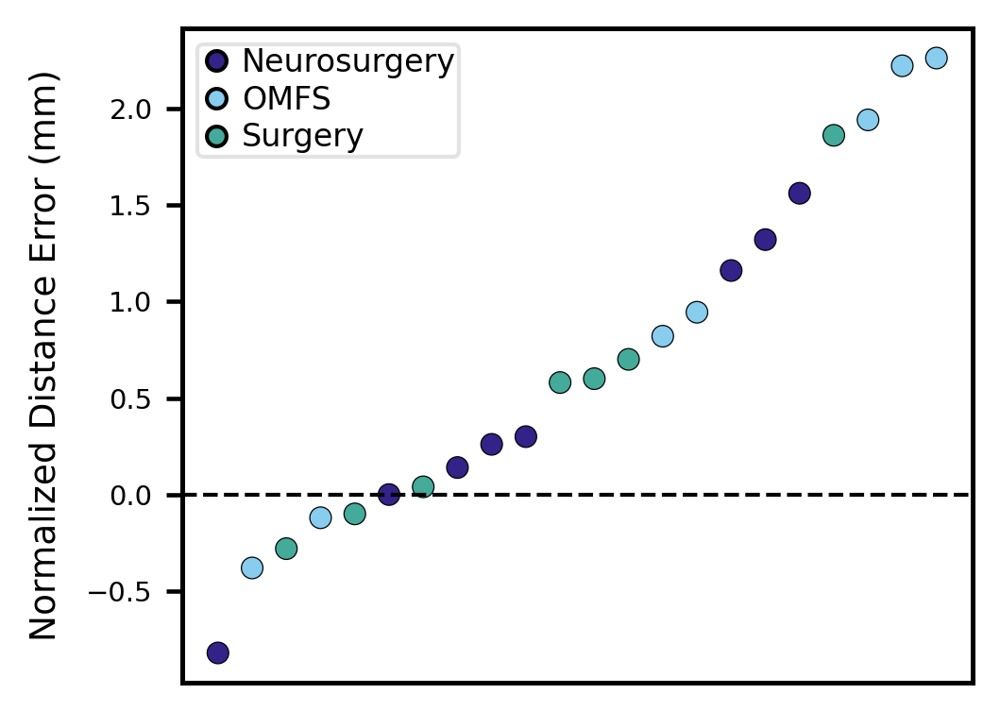

Button(description='Download Fig A (600 dpi)', layout=Layout(width='230px'), style=ButtonStyle())

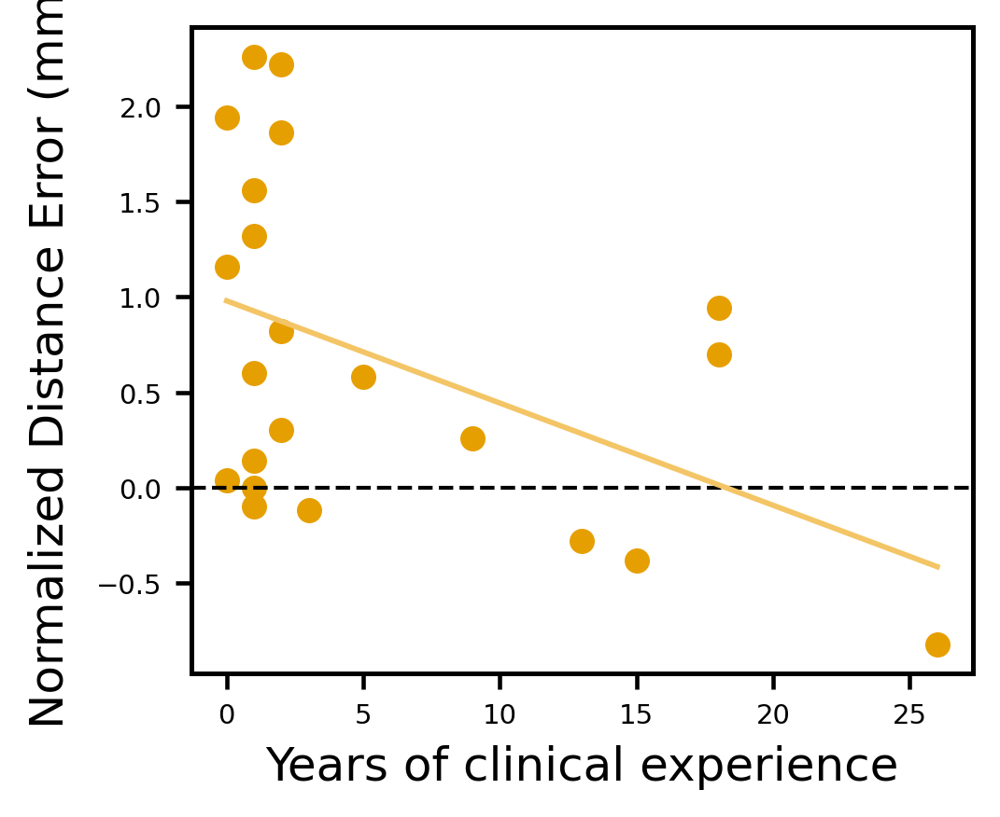

Button(description='Download Fig B (600 dpi)', layout=Layout(width='230px'), style=ButtonStyle())


=== CHECK RX WITH NORMERR (Panel C) ===
 PID  NormErr_mm
   4       -0.38
 PID  NormErr_mm
   8        1.16
 PID  NormErr_mm
  10         0.3
 PID  NormErr_mm
  12       -0.82
 PID  NormErr_mm
  14        1.56
 PID  NormErr_mm
  15        0.26
 PID  NormErr_mm
  19        -0.1
 PID  NormErr_mm
  22         0.7

=== DEBUG: Rx Group Counts (FINAL) ===
RxGroup
No Rx    14
Rx        8
Name: count, dtype: int64

List of participants per group:
No Rx: 14 participants → [1, 2, 3, 5, 6, 7, 9, 11, 13, 16, 17, 18, 20, 21]
Rx: 8 participants → [4, 8, 10, 12, 14, 15, 19, 22]


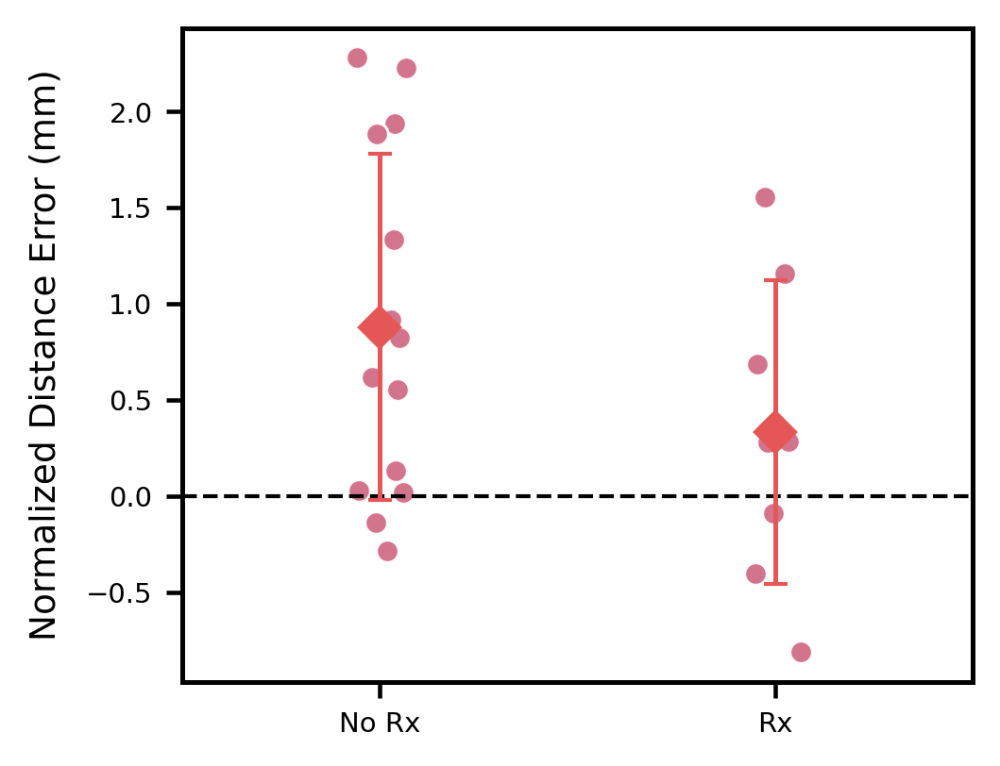

Button(description='Download Fig C (600 dpi)', layout=Layout(width='230px'), style=ButtonStyle())


=== FIGURE C: Mean ± SD + P-value (Rx vs No Rx) ===
No Rx: Mean = 0.880 mm, SD = 0.900 mm, n = 14
Rx   : Mean = 0.335 mm, SD = 0.789 mm, n = 8

Welch's t-test p-value = 0.1577


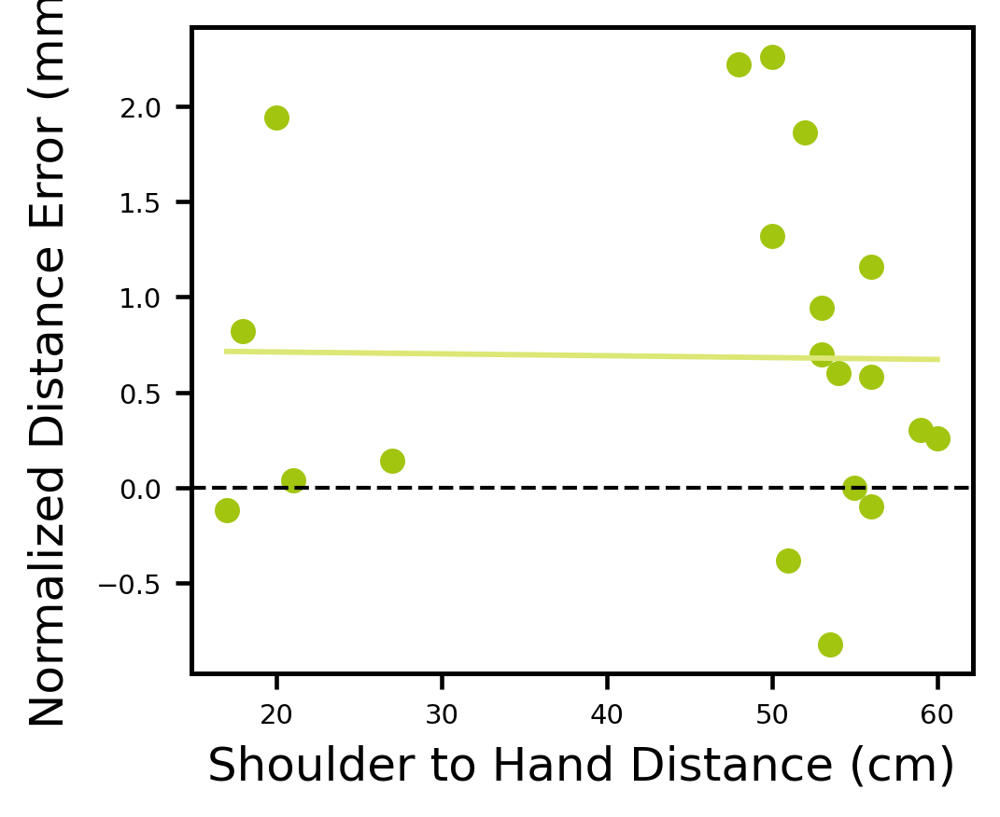

Button(description='Download Fig D (600 dpi)', layout=Layout(width='230px'), style=ButtonStyle())


=== FIGURE A: Top/Bottom Performers (by |Error|) ===

Top 3 Performers (Closest to 0 Error):
01. Neurosurgery | NormErr = 0.000 mm | |Error| = 0.000 mm
02. Surgery      | NormErr = 0.040 mm | |Error| = 0.040 mm
03. Surgery      | NormErr = -0.100 mm | |Error| = 0.100 mm

Worst 3 Performers (Farthest from 0 Error):
20. OMFS         | NormErr = 1.940 mm | |Error| = 1.940 mm
21. OMFS         | NormErr = 2.220 mm | |Error| = 2.220 mm
22. OMFS         | NormErr = 2.260 mm | |Error| = 2.260 mm

=== FIGURE A: Specialty Mean ± SD + Significance Testing ===
Neurosurgery: Mean = 0.490 mm, SD = 0.797 mm, n = 8
OMFS        : Mean = 1.098 mm, SD = 1.087 mm, n = 7
Surgery     : Mean = 0.486 mm, SD = 0.717 mm, n = 7

One-Way ANOVA p-value: 0.3369
Kruskal–Wallis p-value: 0.4592

=== FIGURE B: Linear Regression (Years vs NormErr) ===
Line of best fit:  y = -0.0536x + 0.9792
R² = 0.2066

=== FIGURE C: Mean ± SD + P-value (Rx vs No Rx) ===
No Rx: Mean = 0.880 mm, SD = 0.900 mm, n = 14
Rx   : Mean = 0.33

Button(description='Download FigA_SortedBySpecialty.svg', layout=Layout(width='260px'), style=ButtonStyle())

Button(description='Download FigB_Years_vs_NormErr.svg', layout=Layout(width='260px'), style=ButtonStyle())

Button(description='Download FigC_Rx_vs_NoRx.svg', layout=Layout(width='260px'), style=ButtonStyle())

Button(description='Download FigD_ExtendedOnly.svg', layout=Layout(width='260px'), style=ButtonStyle())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [3]:
# FIGURE 8 A-D

# - Panel A: Sorted distribution by specialty (scatter, colored by specialty)
# - Panel B: Years of clinical experience vs NormErr (gold circles, light-gold trendline) + y=0 dashed
# - Panel C: Rx vs No Rx (avg of L/R in diopters; purple squares as points; red diamond mean±SD per group) + y=0 dashed
# - Panel D: Shoulder-to-Hand Distance (cm), Extended ONLY (red circles, lighter-red trendline) + y=0 dashed
# - Each plot is its own figure. No panel labels, no legends (per request).
# - Fonts: Arial (fallback to DejaVu Sans)
# - Saves PNG (300 dpi) + TIFF (600 dpi) and shows a download button for each in Colab

import io, re, os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy import stats

# -------- Colab helpers --------
try:
    from google.colab import files
    import ipywidgets as widgets
    _IS_COLAB = True
except Exception:
    _IS_COLAB = False

# =================== STYLE ===================
rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "DejaVu Sans"],
    "axes.linewidth": 1.2,
    "xtick.major.size": 4, "ytick.major.size": 4,
    "xtick.major.width": 1.1, "ytick.major.width": 1.1,
})
AX_LABEL_FONTSIZE = 12
TICK_FONTSIZE     = 7
SCAT_SZ           = 30
FIG_SIZE          = (3.6, 3.0)
DPI_PNG           = 300
DPI_TIF           = 600

# Colors (updated)
COL_SPEC = {"Neurosurgery": "#332288",  # navy purple (A legend)
            "OMFS": "#88CCEE",          # sky blue   (A legend)
            "Surgery": "#44AA99",       # teal green (A legend)
            "Unspecified": "#9E9E9E"}   # grey fallback (A legend)

COL_B_PT, COL_B_LINE = "#E69F00", "#F3C566"   # B: orange-gold points + lighter line (unchanged)

COL_C_PT, COL_C_MEAN = "#D16D87", "#E45756"   # C: professional rose-pink circles + red diamond/error bars

COL_D_PT, COL_D_LINE = "#A2C510", "#DCE775"   # D: yellow-green circles + lighter yellow-green trendline

GREY_LINE0           = (0.0, 0.0, 0.0, 1.0)

# =================== LOAD EXCEL (coords + survey) ===================
if "uploaded" not in globals() or not len(uploaded):
    raise RuntimeError("No uploaded workbook found. Re-run the upload cell to populate `uploaded`.")

xlsx_name, xlsx_bytes = next(iter(uploaded.items()))
xls = pd.ExcelFile(io.BytesIO(xlsx_bytes))

# Heuristic sheet picks
sheet_coords = next((s for s in xls.sheet_names if re.search(r"coord", s, re.I)), None)
sheet_survey = next((s for s in xls.sheet_names if re.search(r"survey", s, re.I)), None)
if not sheet_coords or not sheet_survey:
    raise RuntimeError(f"Sheets not found. Have: {xls.sheet_names}")

dfc_raw = pd.read_excel(io.BytesIO(xlsx_bytes), sheet_name=sheet_coords, header=0)
dfs     = pd.read_excel(io.BytesIO(xlsx_bytes), sheet_name=sheet_survey, header=0)
if "Unnamed: 0" in dfc_raw.columns:
    dfc_raw = dfc_raw.drop(columns=["Unnamed: 0"])

def find_pid_col(df):
    for c in df.columns:
        if isinstance(c, str) and re.search(r"participant\s*id|^id$", c, re.I):
            return c
    return df.columns[0]

pid_coords = find_pid_col(dfc_raw)

# find a header row that contains "(mm)"
label_row_idx = None
for r in range(min(6, len(dfc_raw))):
    if dfc_raw.iloc[r].astype(str).str.contains(r"\(mm\)", case=False, regex=True).any():
        label_row_idx = r
        break
if label_row_idx is None:
    raise RuntimeError("Could not find '(mm)' label row in Coordinates sheet.")

subhdr = dfc_raw.iloc[label_row_idx]
cols = list(dfc_raw.columns)

def mm_positions(k):
    pat = rf"^\s*{k}\s*\(mm\)\s*$|^\s*{k}\s*mm\s*$"
    return [j for j, v in enumerate(subhdr.astype(str)) if re.search(pat, str(v).strip(), re.I)]

def find_mm_runs():
    idxs = [mm_positions(k) for k in range(1, 6)]
    runs = []
    for i1 in idxs[0]:
        prev = i1; chain = [i1]; ok = True
        for k in range(1, 5):
            cand = [j for j in idxs[k] if j > prev]
            if not cand:
                ok = False; break
            nxt = cand[0]; chain.append(nxt); prev = nxt
        if ok and len(chain) == 5:
            runs.append(chain)
    return runs

runs = find_mm_runs()
if len(runs) < 2:
    raise RuntimeError("Need two 1..5(mm) runs (first=Transfer, second=Direct).")
run_T, run_D = runs[0], runs[1]
T_cols = [cols[j] for j in run_T]
D_cols = [cols[j] for j in run_D]
data_rows = dfc_raw.index[dfc_raw.index > label_row_idx]

def avg_boundary_mm(block_cols):
    use_cols = [pid_coords] + [c for c in block_cols if c in dfc_raw.columns]
    sub = dfc_raw.loc[data_rows, use_cols].copy()
    sub[pid_coords] = pd.to_numeric(sub[pid_coords], errors="coerce").astype("Int64")
    sub = sub.dropna(subset=[pid_coords])
    for c in block_cols:
        if c in sub.columns:
            sub[c] = pd.to_numeric(sub[c], errors="coerce")
    mm = sub[block_cols].mean(axis=1)
    return pd.DataFrame({"PID": sub[pid_coords], "Boundary_mm": mm})

df_T = avg_boundary_mm(T_cols).rename(columns={"Boundary_mm": "Boundary_Transfer_mm"})
df_D = avg_boundary_mm(D_cols).rename(columns={"Boundary_mm": "Boundary_Direct_mm"})
coord = pd.merge(df_T, df_D, on="PID", how="inner")

# Survey columns
SPEC_COL  = next((c for c in dfs.columns if re.search(r"clinical\s*specialty", c, re.I)), None)
YEARS_COL = next((c for c in dfs.columns if re.search(r"years.*clinical.*experience", c, re.I)), None)

def find_eye_col(df, side):
    side_pat = "righ?t" if side == "right" else "left"
    patt = rf"^\s*{side_pat}\s*eye\s*(?:\((?:D|diopters?)\))?\s*$"
    for c in df.columns:
        if isinstance(c, str) and re.search(patt, c, re.I):
            return c
    return None

LEFT_RAW  = find_eye_col(dfs, "left")
RIGHT_RAW = find_eye_col(dfs, "right")

pid_survey = find_pid_col(dfs)
if re.search(r"participant\s*id|^id$", pid_survey, re.I):
    dfs["PID"] = pd.to_numeric(dfs[pid_survey], errors="coerce").astype("Int64")
else:
    pids = coord["PID"].dropna().astype(int).sort_values().tolist()
    dfs = dfs.iloc[:len(pids), :].copy()
    dfs["PID"] = pd.Series(pids, index=dfs.index).astype("Int64")

def parse_se(text):
    if pd.isna(text): return np.nan
    s = str(text)
    nums = re.findall(r'[-+]?\d+(?:\.\d+)?', s)
    if not nums: return np.nan
    vals = [float(n) for n in nums]
    return vals[0] + 0.5*vals[1] if len(vals) >= 2 else vals[0]

dfs["Left Eye (D)"]  = dfs[LEFT_RAW].apply(parse_se)  if LEFT_RAW  else np.nan
dfs["Right Eye (D)"] = dfs[RIGHT_RAW].apply(parse_se) if RIGHT_RAW else np.nan

# Reach distances (prefer cm; convert mm if present)
EXT_CM, FLEX_CM = "max distance (cm)", "min distance (cm)"
EXT_MM, FLEX_MM = "Arm extended (mm)", "Arm flexed (mm)"
dfs["Extended_cm"] = np.nan; dfs["Flexed_cm"] = np.nan
if EXT_CM in dfs.columns:  dfs["Extended_cm"] = pd.to_numeric(dfs[EXT_CM],  errors="coerce")
if FLEX_CM in dfs.columns: dfs["Flexed_cm"]  = pd.to_numeric(dfs[FLEX_CM], errors="coerce")
if EXT_MM in dfs.columns:  dfs["Extended_cm"] = pd.to_numeric(dfs[EXT_MM],  errors="coerce")/10.0
if FLEX_MM in dfs.columns: dfs["Flexed_cm"]  = pd.to_numeric(dfs[FLEX_MM], errors="coerce")/10.0

# Unified metric for ALL panels: NormErr = Transfer − Direct
merged = coord.merge(
    dfs[["PID", SPEC_COL, YEARS_COL, "Left Eye (D)", "Right Eye (D)", "Extended_cm", "Flexed_cm"]],
    on="PID", how="left"
)
merged["NormErr_mm"] = (
    pd.to_numeric(merged["Boundary_Transfer_mm"], errors="coerce")
    - pd.to_numeric(merged["Boundary_Direct_mm"],  errors="coerce")
)

# Optional exclusions (if any)
#merged = merged[~merged["PID"].isin(EXCLUDE)].copy()

# =================== Helper: save + button ===================
def save_and_button(fig, png_path, tif_path, title_btn="Download 600 dpi TIFF"):
    fig.savefig(png_path, dpi=DPI_PNG, bbox_inches="tight")
    fig.savefig(tif_path, dpi=DPI_TIF, bbox_inches="tight",
                pil_kwargs={"compression": "tiff_lzw"})
    plt.show()
    if _IS_COLAB:
        btn = widgets.Button(description=title_btn, button_style="",
                             layout=widgets.Layout(width="230px"))
        def _dl(_): files.download(tif_path)
        btn.on_click(_dl)
        display(btn)

# =================== FIGURE A (legend font size tuned) ===================
# Sorted NormErr by specialty — scatter, colored by specialty, with legend

panelA = merged[["PID", "NormErr_mm", SPEC_COL]].dropna(subset=["NormErr_mm"])
if SPEC_COL in panelA.columns:
    panelA[SPEC_COL] = (panelA[SPEC_COL].astype(str).str.strip().str.title()
                        .replace({"Omfs": "OMFS"}))
else:
    panelA[SPEC_COL] = "Unspecified"

figA, axA = plt.subplots(figsize=FIG_SIZE, dpi=DPI_PNG)
if not panelA.empty:
    srt = panelA.sort_values("NormErr_mm").reset_index(drop=True)
    panelA_sorted = srt.copy()   # <-- ADD THIS LINE
    x = np.arange(len(srt))
    axA.axhline(0, color="black", linestyle="--", linewidth=1.0)

    colors = [COL_SPEC.get(s, COL_SPEC["Unspecified"]) for s in srt[SPEC_COL]]
    axA.scatter(x, srt["NormErr_mm"], s=SCAT_SZ, c=colors,
                edgecolors="black", linewidth=0.3)

    axA.set_xticks([])
    axA.set_ylabel("Normalized Distance Error (mm)", fontsize=9, labelpad=6)
    axA.tick_params(labelsize=7)

    # Build legend entries dynamically
    handles = []
    for name in ["Neurosurgery", "OMFS", "Surgery"]:
        if name in srt[SPEC_COL].values:
            handles.append(plt.Line2D([], [], marker='o', linestyle='None',
                                      markerfacecolor=COL_SPEC[name],
                                      markeredgecolor='black',
                                      markersize=5, label=name))
    if handles:
        axA.legend(handles=handles,
                   frameon=True, framealpha=0.55,
                   fontsize=8,              # legend font size tuned
                   loc="upper left", borderpad=0.1,
                   handletextpad=0.3, labelspacing=0.2,
                   handlelength=1.0, columnspacing=0.5)

pngA, tifA = "FigA_SortedBySpecialty.png", "FigA_SortedBySpecialty_600dpi.tif"
save_and_button(figA, pngA, tifA, "Download Fig A (600 dpi)")

# =================== FIGURE B ===================
# Years vs NormErr — gold circles + light-gold trendline, dashed y=0
panelB = merged[[YEARS_COL, "NormErr_mm"]].dropna()
figB, axB = plt.subplots(figsize=FIG_SIZE, dpi=DPI_PNG)
if not panelB.empty:
    x = pd.to_numeric(panelB[YEARS_COL], errors="coerce").to_numpy(float)
    y = pd.to_numeric(panelB["NormErr_mm"], errors="coerce").to_numpy(float)
    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    axB.axhline(0, color="black", linestyle="--", linewidth=1.0)
    axB.scatter(x, y, s=SCAT_SZ, color=COL_B_PT)
    if len(x) >= 3:
        k, b, *_ = stats.linregress(x, y)
        xx = np.linspace(np.nanmin(x), np.nanmax(x), 100)
        axB.plot(xx, k*xx + b, color=COL_B_LINE, linewidth=1.4)
    axB.set_xlabel("Years of clinical experience", fontsize=AX_LABEL_FONTSIZE)
    axB.set_ylabel("Normalized Distance Error (mm)", fontsize=AX_LABEL_FONTSIZE, labelpad=6)
    axB.tick_params(labelsize=TICK_FONTSIZE)
pngB, tifB = "FigB_Years_vs_NormErr.png", "FigB_Years_vs_NormErr_600dpi.tif"
save_and_button(figB, pngB, tifB, "Download Fig B (600 dpi)")

EXCLUDE = {14, 20}

# =================== FIGURE C (Corrected Rx Classification + Vertical Jitter) ===================

figC, axC = plt.subplots(figsize=FIG_SIZE, dpi=DPI_PNG)

# Extract needed columns from *merged* (not merged_full)
tmp = merged[["PID", "NormErr_mm", "Left Eye (D)", "Right Eye (D)"]].copy()

# Compute spherical-equivalent average if both are present
L = pd.to_numeric(tmp["Left Eye (D)"],  errors="coerce")
R = pd.to_numeric(tmp["Right Eye (D)"], errors="coerce")
tmp["Avg_D"] = pd.DataFrame({"L": L, "R": R}).mean(axis=1, skipna=True)

# -------------------------------------------
# ★★ RX PARTICIPANTS (Final, user-validated) ★★
TRUE_RX = {4, 8, 10, 12, 14, 15, 19, 22}
# -------------------------------------------

# Assign Rx groups
tmp["RxGroup"] = tmp["PID"].apply(lambda pid: "Rx" if pid in TRUE_RX else "No Rx")

# Apply exclusions ONLY to panel C if desired
panelC = tmp.dropna(subset=["NormErr_mm"]).copy()

# === DIAGNOSTICS: Show NormErr for each Rx PID ==========
print("\n=== CHECK RX WITH NORMERR (Panel C) ===")
for pid in sorted(TRUE_RX):
    row = panelC.loc[panelC["PID"] == pid, ["PID", "NormErr_mm"]]
    print(row.to_string(index=False))

# === DEBUG COUNTS ========================================
print("\n=== DEBUG: Rx Group Counts (FINAL) ===")
print(panelC["RxGroup"].value_counts())

print("\nList of participants per group:")
for g in ["No Rx", "Rx"]:
    ids = panelC.loc[panelC["RxGroup"] == g, "PID"].tolist()
    print(f"{g}: {len(ids)} participants → {ids}")

# =========================================================
# ======================= PLOT ============================
# =========================================================
if not panelC.empty:
    axC.axhline(0, color="black", linestyle="--", linewidth=1.0)

    order = ["No Rx", "Rx"]
    x_pos = {g: i for i, g in enumerate(order)}

    rng = np.random.default_rng(42)

    for g in order:
        yv = pd.to_numeric(panelC.loc[panelC["RxGroup"] == g, "NormErr_mm"],
                           errors="coerce").to_numpy(float)

        # Horizontal jitter
        jitter_x = (rng.random(yv.size) - 0.5) * 0.14

        # Vertical jitter to separate overlapping points
        jitter_y = (rng.random(yv.size) - 0.5) * 0.06
        y_plot = yv + jitter_y

        # Scatter points
        axC.scatter(
            np.full(yv.size, x_pos[g]) + jitter_x,
            y_plot,
            s=32,
            marker="o",
            color=COL_C_PT,
            alpha=0.95,
            edgecolors="white",
            linewidths=0.7
        )

        # Mean ± SD (actual values, not jittered)
        m  = float(np.mean(yv))
        sd = float(np.std(yv, ddof=1)) if yv.size > 1 else 0.0

        axC.errorbar(
            [x_pos[g]], [m], yerr=[[sd], [sd]],
            fmt="D", ms=7, color=COL_C_MEAN, ecolor=COL_C_MEAN,
            elinewidth=1.2, capsize=3, lw=1.2, zorder=5
        )

    axC.set_xlim(-0.5, len(order) - 0.5)
    axC.set_xticks([x_pos[g] for g in order])
    axC.set_xticklabels(order, fontsize=9)

    axC.set_ylabel("Normalized Distance Error (mm)", fontsize=9, labelpad=6)
    axC.tick_params(labelsize=7)

pngC, tifC = "FigC_Rx_vs_NoRx.png", "FigC_Rx_vs_NoRx_600dpi.tif"
save_and_button(figC, pngC, tifC, "Download Fig C (600 dpi)")

# =========================================================
# ================ STATISTICS FOR PANEL C ==================
# =========================================================

print("\n=== FIGURE C: Mean ± SD + P-value (Rx vs No Rx) ===")

no_rx_vals = pd.to_numeric(panelC.loc[panelC["RxGroup"] == "No Rx", "NormErr_mm"], errors="coerce")
rx_vals    = pd.to_numeric(panelC.loc[panelC["RxGroup"] == "Rx",    "NormErr_mm"], errors="coerce")

# Remove NaN
no_rx_vals = no_rx_vals[np.isfinite(no_rx_vals)]
rx_vals    = rx_vals[np.isfinite(rx_vals)]

mean_no = no_rx_vals.mean()
sd_no   = no_rx_vals.std(ddof=1) if len(no_rx_vals) > 1 else 0

mean_rx = rx_vals.mean()
sd_rx   = rx_vals.std(ddof=1) if len(rx_vals) > 1 else 0

# Welch's t-test
t_stat, p_val = stats.ttest_ind(no_rx_vals, rx_vals, equal_var=False)

print(f"No Rx: Mean = {mean_no:.3f} mm, SD = {sd_no:.3f} mm, n = {len(no_rx_vals)}")
print(f"Rx   : Mean = {mean_rx:.3f} mm, SD = {sd_rx:.3f} mm, n = {len(rx_vals)}")
print(f"\nWelch's t-test p-value = {p_val:.4f}")

# =================== FIGURE D ===================
# Extended-only reach distance vs NormErr — red circles, lighter-red trendline; dashed y=0; no legend

panelD_all = merged[["PID", "NormErr_mm", "Extended_cm"]].copy()

# Apply exclusions only to C and D
panelD_all = panelD_all[~panelD_all["PID"].isin(EXCLUDE)]

# Rename AFTER exclusion so Dist_cm exists
panelD_all = panelD_all.rename(columns={"Extended_cm": "Dist_cm"}).dropna()

figD, axD = plt.subplots(figsize=FIG_SIZE, dpi=DPI_PNG)
if not panelD_all.empty:
    xi = pd.to_numeric(panelD_all["Dist_cm"], errors="coerce").to_numpy(float)
    yi = pd.to_numeric(panelD_all["NormErr_mm"], errors="coerce").to_numpy(float)
    m = np.isfinite(xi) & np.isfinite(yi)
    xi, yi = xi[m], yi[m]

    axD.axhline(0, color="black", linestyle="--", linewidth=1.0)
    axD.scatter(xi, yi, s=SCAT_SZ, color=COL_D_PT)

    if xi.size >= 3:
        k, b, *_ = stats.linregress(xi, yi)
        xx = np.linspace(np.nanmin(xi), np.nanmax(xi), 100)
        axD.plot(xx, k*xx + b, color=COL_D_LINE, linewidth=1.4)

    axD.set_xlabel("Shoulder to Hand Distance (cm)", fontsize=AX_LABEL_FONTSIZE)
    axD.set_ylabel("Normalized Distance Error (mm)", fontsize=AX_LABEL_FONTSIZE, labelpad=6)
    axD.tick_params(labelsize=TICK_FONTSIZE)

pngD, tifD = "FigD_ExtendedOnly.png", "FigD_ExtendedOnly_600dpi.tif"
save_and_button(figD, pngD, tifD, "Download Fig D (600 dpi)")

# =================== STATS & RANK OUTPUT (Expanded with Specialty Averages) ===================

# =================== FIGURE A: Best & Worst Performers (by |Error| proximity to 0) ===================

print("\n=== FIGURE A: Top/Bottom Performers (by |Error|) ===")
panelA_abs = panelA_sorted.copy()
panelA_abs["AbsErr"] = panelA_abs["NormErr_mm"].abs()

# Sort by absolute error (ascending = best)
panelA_abs_sorted = panelA_abs.sort_values("AbsErr", ascending=True).reset_index(drop=True)

# Top 3 closest to 0 (best) and top 3 farthest from 0 (worst)
best3  = panelA_abs_sorted.head(3)
worst3 = panelA_abs_sorted.tail(3)

print("\nTop 3 Performers (Closest to 0 Error):")
for i, row in best3.iterrows():
    print(f"{i+1:02d}. {row[SPEC_COL]:12s} | NormErr = {row['NormErr_mm']:.3f} mm | |Error| = {row['AbsErr']:.3f} mm")

print("\nWorst 3 Performers (Farthest from 0 Error):")
for i, row in worst3.iterrows():
    print(f"{i+1:02d}. {row[SPEC_COL]:12s} | NormErr = {row['NormErr_mm']:.3f} mm | |Error| = {row['AbsErr']:.3f} mm")

print("\n=== FIGURE A: Specialty Mean ± SD + Significance Testing ===")

# Copy dataframe used for Panel A
panelA_stats = panelA_sorted.copy()
panelA_stats["NormErr_mm"] = pd.to_numeric(panelA_stats["NormErr_mm"], errors="coerce")

# Compute per-specialty summary stats
spec_stats = panelA_stats.groupby(SPEC_COL)["NormErr_mm"].agg(["mean", "std", "count"])
for spec, row in spec_stats.iterrows():
    print(f"{spec:12s}: Mean = {row['mean']:.3f} mm, SD = {row['std']:.3f} mm, n = {int(row['count'])}")

# Prepare data for significance testing
groups = []
group_labels = []
for spec in spec_stats.index:
    vals = panelA_stats.loc[panelA_stats[SPEC_COL] == spec, "NormErr_mm"].dropna().to_numpy(float)
    groups.append(vals)
    group_labels.append(spec)

# -------- One-Way ANOVA --------
if sum(len(g) > 1 for g in groups) >= 2:
    fstat, p_anova = stats.f_oneway(*groups)
    print(f"\nOne-Way ANOVA p-value: {p_anova:.4f}")
else:
    print("\nOne-Way ANOVA p-value: Not enough data to compute.")

# -------- Kruskal–Wallis (non-parametric) --------
if sum(len(g) > 1 for g in groups) >= 2:
    hstat, p_kw = stats.kruskal(*groups)
    print(f"Kruskal–Wallis p-value: {p_kw:.4f}")
else:
    print("Kruskal–Wallis p-value: Not enough data to compute.")

print("\n=== FIGURE B: Linear Regression (Years vs NormErr) ===")
if len(panelB) >= 3:
    xB = pd.to_numeric(panelB[YEARS_COL], errors="coerce").to_numpy(float)
    yB = pd.to_numeric(panelB["NormErr_mm"], errors="coerce").to_numpy(float)
    mB = np.isfinite(xB) & np.isfinite(yB)
    xB, yB = xB[mB], yB[mB]
    slopeB, interceptB, rB, pB, seB = stats.linregress(xB, yB)
    r2B = rB**2
    print(f"Line of best fit:  y = {slopeB:.4f}x + {interceptB:.4f}")
    print(f"R² = {r2B:.4f}")

print("\n=== FIGURE C: Mean ± SD + P-value (Rx vs No Rx) ===")

# Extract data
no_rx_vals = pd.to_numeric(panelC.loc[panelC["RxGroup"] == "No Rx", "NormErr_mm"], errors="coerce")
rx_vals    = pd.to_numeric(panelC.loc[panelC["RxGroup"] == "Rx", "NormErr_mm"], errors="coerce")

# Clean out NaN
no_rx_vals = no_rx_vals[np.isfinite(no_rx_vals)]
rx_vals    = rx_vals[np.isfinite(rx_vals)]

# Compute stats
mean_no = no_rx_vals.mean()
sd_no   = no_rx_vals.std(ddof=1) if len(no_rx_vals) > 1 else 0

mean_rx = rx_vals.mean()
sd_rx   = rx_vals.std(ddof=1) if len(rx_vals) > 1 else 0

# Welch’s t-test (best for unequal variances)
t_stat, p_val = stats.ttest_ind(no_rx_vals, rx_vals, equal_var=False)

# Output
print(f"No Rx: Mean = {mean_no:.3f} mm, SD = {sd_no:.3f} mm, n = {len(no_rx_vals)}")
print(f"Rx   : Mean = {mean_rx:.3f} mm, SD = {sd_rx:.3f} mm, n = {len(rx_vals)}")
print(f"\nWelch's t-test p-value = {p_val:.4f}")

print("\n=== FIGURE D: Linear Regression (Shoulder–Hand vs NormErr) ===")
if len(panelD_all) >= 3:
    xD = pd.to_numeric(panelD_all["Dist_cm"], errors="coerce").to_numpy(float)
    yD = pd.to_numeric(panelD_all["NormErr_mm"], errors="coerce").to_numpy(float)
    mD = np.isfinite(xD) & np.isfinite(yD)
    xD, yD = xD[mD], yD[mD]
    slopeD, interceptD, rD, pD, seD = stats.linregress(xD, yD)
    r2D = rD**2
    print(f"Line of best fit:  y = {slopeD:.4f}x + {interceptD:.4f}")
    print(f"R² = {r2D:.4f}")

# =========================================================
# OPTIONAL: SAVE ALL FOUR FIGURES AS SVG + DOWNLOAD BUTTONS
# =========================================================

# Keep text editable in the SVGs
import matplotlib as mpl
mpl.rcParams['svg.fonttype'] = 'none'

# Save paths
svgA = "FigA_SortedBySpecialty.svg"
svgB = "FigB_Years_vs_NormErr.svg"
svgC = "FigC_Rx_vs_NoRx.svg"
svgD = "FigD_ExtendedOnly.svg"

# Save all as SVG
figA.savefig(svgA, format="svg", bbox_inches="tight")
figB.savefig(svgB, format="svg", bbox_inches="tight")
figC.savefig(svgC, format="svg", bbox_inches="tight")
figD.savefig(svgD, format="svg", bbox_inches="tight")

print("\nAll SVGs saved.")

# Download buttons (Colab only)
if _IS_COLAB:
    import ipywidgets as widgets
    from google.colab import files

    def make_svg_button(path):
        btn = widgets.Button(
            description=f"Download {path}",
            layout=widgets.Layout(width="260px")
        )
        def _dl(_):
            files.download(path)
        btn.on_click(_dl)
        display(btn)

    print("Download buttons:")
    make_svg_button(svgA)
    make_svg_button(svgB)
    make_svg_button(svgC)
    make_svg_button(svgD)

Using sheet: Survey


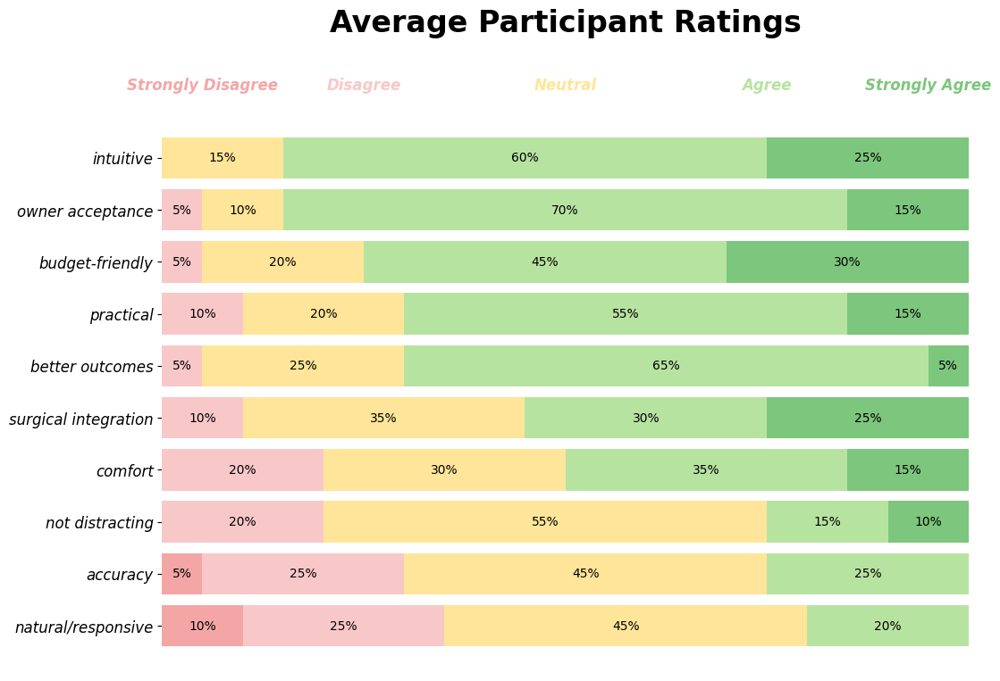

Saved 600 dpi TIFF → Likert_Survey_Pastel_ColorHeaders.tiff


Button(description='Download Likert_Survey_Pastel_ColorHeaders.tiff', style=ButtonStyle())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# FIGURE 9

import io, pandas as pd, numpy as np, matplotlib.pyplot as plt

# ---- Load Survey sheet ----
first_file = list(uploaded.keys())[0]
xls = pd.ExcelFile(io.BytesIO(uploaded[first_file]))
sheet_name = next((nm for nm in xls.sheet_names if "survey" in nm.lower()), xls.sheet_names[0])
print(f"Using sheet: {sheet_name}")
df = pd.read_excel(xls, sheet_name=sheet_name)

# ---- Config ----
LEFT_LABELS = [
    "intuitive","natural/responsive","accuracy","comfort","surgical integration",
    "not distracting","practical","better outcomes","owner acceptance","budget-friendly",
]

LIKERT_MAP = {
    1: "Strongly Disagree",
    2: "Disagree",
    3: "Neutral",
    4: "Agree",
    5: "Strongly Agree"
}

# Pastel palette (softer)
COLORS = {
    1: "#F4A6A6",  # soft rose
    2: "#F8C8C8",  # pale coral
    3: "#FFE599",  # neutral yellow
    4: "#B7E3A1",  # pastel green
    5: "#7DC67D",  # soft forest green
}

# ---- Extract columns B→K by position and rename ----
data = df.iloc[:, 1:11].copy()   # B..K (0-indexed slice 1:11)
data.columns = LEFT_LABELS

# ---- Compute % distribution 1..5 per row ----
likert_rows = []
for label in LEFT_LABELS:
    s = pd.to_numeric(data[label], errors="coerce").dropna()
    counts = s.value_counts().reindex([1,2,3,4,5], fill_value=0)
    perc = (counts / counts.sum() * 100).round(1)
    likert_rows.append(perc)

likert_df = pd.DataFrame(likert_rows, index=LEFT_LABELS)

# Sort by (Agree + Strongly Agree) descending
likert_df["Positivity"] = likert_df[4] + likert_df[5]
likert_df = likert_df.sort_values("Positivity", ascending=False).drop(columns=["Positivity"])

# ---- Plot ----
fig, ax = plt.subplots(figsize=(12.0, 8.2))

y_pos = np.arange(len(likert_df))
left = np.zeros(len(likert_df))

# Bars in order: 1..5 (left→right)
for score in [1,2,3,4,5]:
    vals = likert_df[score].values
    ax.barh(y_pos, vals, left=left, color=COLORS[score], edgecolor="none", zorder=2)

    # Percent labels inside each segment
    for i, v in enumerate(vals):
        if v > 0:
            ax.text(left[i] + v/2, i, f"{v:.0f}%", ha="center", va="center",
                    fontsize=10, color="black", zorder=3)
    left += vals

# Y labels (italic)
ax.set_yticks(y_pos)
ax.set_yticklabels(likert_df.index, fontsize=12, fontstyle="italic")

# Axis limits & orientation
ax.set_xlim(0, 100)
ax.invert_yaxis()  # top row first
ax.xaxis.set_visible(False)
ax.spines[["top","right","left","bottom"]].set_visible(False)

# ---- Header row at fixed 0/25/50/75/100 positions ----
header_positions = [0, 25, 50, 75, 100]
header_labels    = [LIKERT_MAP[k] for k in [1,2,3,4,5]]
header_colors    = [COLORS[k] for k in [1,2,3,4,5]]

for pos, lbl, col in zip(header_positions, header_labels, header_colors):
    x = pos
    if pos == 0:   x += 5    # nudge inward to avoid spill
    if pos == 100: x -= 5
    ax.text(x, -1.25, lbl, ha="center", va="bottom",
            fontsize=12, fontweight="semibold", fontstyle="italic",
            color=col, zorder=4)

# ---- Title ABOVE headers and centered over the BAR AREA (not entire figure) ----
# Reserve top space for title, then compute the axis midpoint in figure coords.
plt.tight_layout(rect=[0.04, 0.05, 0.98, 0.90])
ax_pos = ax.get_position()  # Bbox in figure coordinates
bar_mid_x = ax_pos.x0 + ax_pos.width / 2.0
fig.suptitle("Average Participant Ratings",
             x=bar_mid_x, y=0.975, fontsize=24, fontweight="semibold")

plt.show()

# ---- Save 600 dpi TIFF ----
fig.savefig("Likert_Survey_Pastel_ColorHeaders.tiff", dpi=600, bbox_inches="tight")
print("Saved 600 dpi TIFF → Likert_Survey_Pastel_ColorHeaders.tiff")

# ---- Download button (for Colab) ----
from google.colab import files
import ipywidgets as widgets
from IPython.display import display

def download_tiff(path):
    btn = widgets.Button(description=f"Download {path}")
    def _on_click(b):
        files.download(path)
    btn.on_click(_on_click)
    display(btn)

download_tiff("Likert_Survey_Pastel_ColorHeaders.tiff")

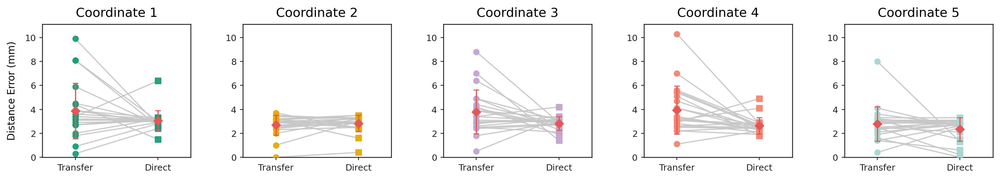

Button(button_style='primary', description='Download 600 dpi TIFF', layout=Layout(width='230px'), style=Button…

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# SUPPLEMENTAL FIGURE 1

import io, re, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from google.colab import files
import ipywidgets as widgets
from IPython.display import display

# -------------------- Load Excel uploaded via Colab widget --------------------
# Assumes you already did: uploaded = files.upload()
xlsx_name, xlsx_bytes = next(iter(uploaded.items()))
xls = pd.ExcelFile(io.BytesIO(xlsx_bytes))
coord_sheet = next(s for s in xls.sheet_names if "coord" in s.strip().lower())
dfc_raw = pd.read_excel(io.BytesIO(xlsx_bytes), sheet_name=coord_sheet, header=None)

def _trim_empty_edges(df):
    df = df.loc[:, ~df.isna().all(axis=0)]
    df = df.loc[~df.isna().all(axis=1)]
    return df.reset_index(drop=True)
dfc_raw = _trim_empty_edges(dfc_raw)

# -------------------- Parse attempts 1..5 (mm) from dfc_raw -------------------
def find_pid_col(df):
    for c in df.columns:
        if isinstance(c, str) and re.search(r"participant\s*id|^id$", c, re.I):
            return c
    return df.columns[0]

df_temp = dfc_raw.copy()
if df_temp.iloc[0].notna().sum() >= max(3, int(df_temp.shape[1]*0.3)):
    df_temp.columns = df_temp.iloc[0].astype(str).tolist()
else:
    df_temp.columns = [str(c) for c in df_temp.columns]

label_row_idx = None
for r in range(min(6, len(df_temp))):
    row = df_temp.iloc[r].astype(str)
    if row.str.contains(r"\(mm\)", case=False, regex=True).any():
        label_row_idx = r
        break
if label_row_idx is None:
    raise RuntimeError("Could not find a '(mm)' label row in the Coordinates sheet.")

subhdr = df_temp.iloc[label_row_idx]
cols   = list(df_temp.columns)
pid_col = find_pid_col(df_temp)

def mm_label_positions(k):
    pat = rf"^\s*{k}\s*\(mm\)\s*$|^\s*{k}\s*mm\s*$"
    return [j for j, v in enumerate(subhdr.astype(str)) if re.search(pat, v.strip(), re.I)]

def find_mm_runs():
    idx_lists = [mm_label_positions(k) for k in range(1, 6)]
    runs = []
    for i1 in idx_lists[0]:
        prev = i1
        chain = [i1]
        ok = True
        for k in range(1, 5):
            cand = [j for j in idx_lists[k] if j > prev]
            if not cand:
                ok = False
                break
            nxt = cand[0]
            chain.append(nxt)
            prev = nxt
        if ok and len(chain) == 5:
            runs.append(chain)
    return runs

runs = find_mm_runs()
if len(runs) < 2:
    raise RuntimeError("Need two 1..5 (mm) runs (first=Transfer, second=Direct).")

run_T, run_D = runs[0], runs[1]
T_cols = [cols[j] for j in run_T]
D_cols = [cols[j] for j in run_D]
data_rows = df_temp.index[df_temp.index > label_row_idx]

def extract_attempts(block_cols, label):
    use_cols = [pid_col] + [c for c in block_cols if c in df_temp.columns]
    sub = df_temp.loc[data_rows, use_cols].copy()
    sub[pid_col] = pd.to_numeric(sub[pid_col], errors="coerce").astype("Int64")
    sub = sub.dropna(subset=[pid_col])
    for c in block_cols:
        if c in sub.columns:
            sub[c] = pd.to_numeric(sub[c], errors="coerce")
    out = {}
    for k, c in enumerate(block_cols, start=1):
        if c in sub.columns:
            s = sub.set_index(pid_col)[c]
            s.name = f"{label}_{k}_mm"
            out[k] = s
    return out

series_T = extract_attempts(T_cols, "Transfer")
series_D = extract_attempts(D_cols, "Direct")

attempt_tables = {}
for k in range(1, 6):
    sT, sD = series_T.get(k), series_D.get(k)
    if sT is None or sD is None:
        continue
    df_k = pd.concat([sT, sD], axis=1).dropna().reset_index()
    df_k.rename(columns={df_k.columns[0]: "PID"}, inplace=True)
    attempt_tables[k] = df_k

# -------------------- Styling: Arial + boxed subplots (titles NOT bold) -------
rcParams.clear()
rcParams["font.family"] = "sans-serif"
rcParams["font.sans-serif"] = ["Arial", "DejaVu Sans"]  # Arial w/ fallback
rcParams["axes.edgecolor"] = "#222222"
rcParams["axes.linewidth"] = 0.9
rcParams["axes.titlesize"] = 13
rcParams["axes.titleweight"] = "normal"    # unbold titles
rcParams["xtick.direction"] = "out"
rcParams["ytick.direction"] = "out"

AX_LABEL_FONTSIZE = 10
TICK_FONTSIZE     = 9
TITLE_FONTSIZE    = 13
SPINE_LW          = 0.9

PAIR_LINE_COLOR   = (0.78, 0.78, 0.78)
PAIR_LINE_W       = 1.2
MARKER_T_SIZE     = 30
MARKER_D_SIZE     = 30
COL_DIAMOND = "#E45756"
DIAMOND_MS  = 6.0
DIAMOND_LW  = 1.2
DIAMOND_CAP = 3
COORD_COLOR = {1: "#1B9E77", 2: "#E6AB02", 3: "#C2A5CF", 4: "#F7856D", 5: "#A6D7D2"}

def plot_summary_diamond_SD(ax, x, y_vals):
    y = np.asarray(y_vals, dtype=float); y = y[np.isfinite(y)]
    if y.size == 0: return np.nan, np.nan
    m, sd = float(np.mean(y)), float(np.std(y, ddof=1)) if y.size > 1 else 0.0
    ax.errorbar([x], [m], yerr=[[sd],[sd]], fmt="D", ms=DIAMOND_MS,
                color=COL_DIAMOND, ecolor=COL_DIAMOND, elinewidth=DIAMOND_LW,
                capsize=DIAMOND_CAP, lw=DIAMOND_LW, zorder=5)
    return m, sd

# -------------------- Global y-range -----------------------------------------
all_vals = []
for k in range(1, 6):
    dfk = attempt_tables.get(k)
    if dfk is not None and not dfk.empty:
        all_vals += [
            dfk[f"Transfer_{k}_mm"].to_numpy(dtype=float),
            dfk[f"Direct_{k}_mm"].to_numpy(dtype=float),
        ]
if all_vals:
    y_all = np.concatenate([v[np.isfinite(v)] for v in all_vals])
    ymin, ymax = float(np.nanmin(y_all)), float(np.nanmax(y_all))
    pad = 0.08 * (ymax - ymin if ymax > ymin else 1.0)
    YLIM = (max(0.0, ymin - pad), ymax + pad)
else:
    YLIM = (0, 10)

# -------------------- Build 1×5 figure (boxed axes) --------------------------
fig_w, fig_h = 14.5, 3.6
fig = plt.figure(figsize=(fig_w, fig_h), dpi=200)
gs = fig.add_gridspec(1, 5, left=0.055, right=0.985, top=0.92, bottom=0.18, wspace=0.35)
axs = [fig.add_subplot(gs[0, i]) for i in range(5)]

for i, (k, ax) in enumerate(zip(range(1, 6), axs), start=1):
    dfk = attempt_tables.get(k)
    if dfk is None or dfk.empty:
        ax.axis("off")
        ax.set_title(f"Coordinate {i}", fontsize=TITLE_FONTSIZE, pad=8)
        continue

    # full rectangle spines
    for side in ("top", "right", "bottom", "left"):
        ax.spines[side].set_visible(True)
        ax.spines[side].set_linewidth(SPINE_LW)
        ax.spines[side].set_color("#222222")

    # data
    color, xT, xD = COORD_COLOR[k], 0.0, 1.0
    yT = dfk[f"Transfer_{k}_mm"].to_numpy(float)
    yD = dfk[f"Direct_{k}_mm"].to_numpy(float)

    for t, d in zip(yT, yD):
        if np.isfinite(t) and np.isfinite(d):
            ax.plot([xT, xD], [t, d], color=PAIR_LINE_COLOR,
                    linewidth=PAIR_LINE_W, alpha=0.95, zorder=1)

    ax.scatter(np.full_like(yT, xT), yT, s=MARKER_T_SIZE, marker="o",
               color=color, alpha=0.95, zorder=3)
    ax.scatter(np.full_like(yD, xD), yD, s=MARKER_D_SIZE, marker="s",
               color=color, alpha=0.95, zorder=3)

    plot_summary_diamond_SD(ax, xT, series_T[k].dropna().to_numpy(float))
    plot_summary_diamond_SD(ax, xD, series_D[k].dropna().to_numpy(float))

    ax.set_xlim(-0.4, 1.4); ax.set_ylim(*YLIM)
    ax.set_xticks([xT, xD]); ax.set_xticklabels(["Transfer", "Direct"], fontsize=TICK_FONTSIZE)
    if i == 1:
        ax.set_ylabel("Distance Error (mm)", fontsize=AX_LABEL_FONTSIZE, labelpad=8)
    else:
        ax.set_ylabel("")
    ax.tick_params(labelsize=TICK_FONTSIZE, width=0.8, length=3, colors="#222222")
    ax.set_box_aspect(0.9)
    ax.margins(x=0.02, y=0.03)
    ax.set_title(f"Coordinate {i}", fontsize=TITLE_FONTSIZE, pad=8)

fig.align_ylabels(axs)

# -------------------- Save, show, and download button ------------------------
out_png = "Coordinates_Figure_Coords1-5_1x5_Arial.png"
out_tif = "Coordinates_Figure_Coords1-5_1x5_Arial_600dpi.tif"
fig.savefig(out_png, dpi=300, bbox_inches="tight")
fig.savefig(out_tif, dpi=600, bbox_inches="tight")
plt.show()

def _download_tiff(_): files.download(out_tif)
btn = widgets.Button(description="Download 600 dpi TIFF",
                     button_style="primary",
                     layout=widgets.Layout(width="230px"))
btn.on_click(_download_tiff)
display(btn)

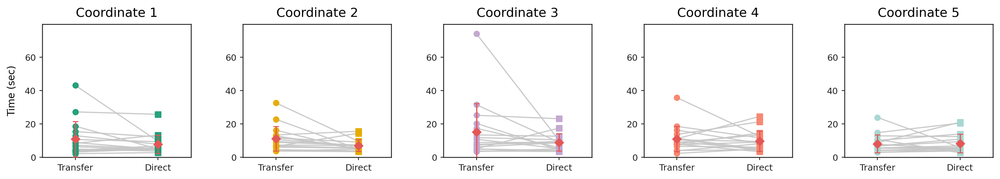

Button(button_style='primary', description='Download 600 dpi TIFF (Seconds)', layout=Layout(width='280px'), st…

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# SUPPLEMENTAL FIGURE 2

import io, re, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import ipywidgets as widgets
from IPython.display import display

# Ensure upload exists or prompt
try:
    uploaded  # noqa: F821
except NameError:
    from google.colab import files
    print("Please upload your Excel file…")
    uploaded = files.upload()

# -------------------- Load Excel (Coordinates sheet) -------------------------
xlsx_name, xlsx_bytes = next(iter(uploaded.items()))
xls = pd.ExcelFile(io.BytesIO(xlsx_bytes))
coord_sheet = next((s for s in xls.sheet_names if "coord" in s.strip().lower()), xls.sheet_names[0])
dfc_raw = pd.read_excel(io.BytesIO(xlsx_bytes), sheet_name=coord_sheet, header=None)

def _trim_empty_edges(df):
    df = df.loc[:, ~df.isna().all(axis=0)]
    df = df.loc[~df.isna().all(axis=1)]
    return df.reset_index(drop=True)

dfc_raw = _trim_empty_edges(dfc_raw)
df_temp = dfc_raw.copy()

# If top row looks like headers, adopt them as column names
if df_temp.iloc[0].notna().sum() >= max(3, int(df_temp.shape[1]*0.3)):
    df_temp.columns = df_temp.iloc[0].astype(str).tolist()
else:
    df_temp.columns = [str(c) for c in df_temp.columns]

# ---------- Build multi-row header strings (first up to 8 rows) per column ----
HDR_ROWS = min(8, len(df_temp))
col_hdr = []
for j, c in enumerate(df_temp.columns):
    parts = []
    for r in range(HDR_ROWS):
        v = df_temp.iloc[r, j]
        if pd.notna(v):
            s = str(v).strip()
            if s:
                parts.append(s)
    header_str = " | ".join(parts)
    col_hdr.append(header_str)

# Helper: find first data row after header rows (heuristic: first row with mostly numbers)
def _first_data_row_idx(df, start=0):
    for r in range(start, min(start+20, len(df))):
        vals = pd.to_numeric(df.iloc[r], errors="coerce")
        # consider it data if >= 30% numeric
        if np.isfinite(vals).sum() >= max(3, int(0.3*len(vals))):
            return r
    return start + 1

data_start_row = _first_data_row_idx(df_temp, start=HDR_ROWS-1)
data_rows = df_temp.index[df_temp.index >= data_start_row]

# -------------------- Token patterns -----------------------------------------
time_token_re = re.compile(r"\b(\(s\)|\bsec\b|\bsecs\b|\bsecond(?:s)?\b|\btime\b|\bs\b)\b", re.I)
transfer_re   = re.compile(r"\btrans?fer\b|\bT\b(?![a-z])", re.I)  # accept "Transfer" or lone "T"
direct_re     = re.compile(r"\bdirect\b|\bD\b(?![a-z])", re.I)     # accept "Direct" or lone "D"
num_re = {k: re.compile(rf"(?<!\d){k}(?!\d)") for k in range(1,6)}  # digit 1..5 as a token

def header_has_time(h): return bool(time_token_re.search(h))
def header_has_transfer(h): return bool(transfer_re.search(h))
def header_has_direct(h): return bool(direct_re.search(h))
def header_has_num(h, k): return bool(num_re[k].search(h))

# Build index lists for each k including time token somewhere in header
idx_lists = {k: [j for j, h in enumerate(col_hdr) if header_has_num(h, k) and header_has_time(h)]
             for k in range(1,6)}

def find_runs(idx_lists_local):
    runs = []
    # greedy left-to-right monotonic chains for 1..5
    for i1 in idx_lists_local[1]:
        chain = [i1]
        ok = True
        prev = i1
        for k in range(2,6):
            cand = [j for j in idx_lists_local[k] if j > prev]
            if not cand:
                ok = False
                break
            nxt = cand[0]
            chain.append(nxt)
            prev = nxt
        if ok and len(chain) == 5:
            runs.append(chain)
    return runs

runs = find_runs(idx_lists)

# If we didn't find two runs, relax time-token requirement but require there is at least
# some time token in the overall header region
if len(runs) < 2 and any(header_has_time(h) for h in col_hdr):
    idx_lists_relaxed = {k: [j for j, h in enumerate(col_hdr) if header_has_num(h, k)]
                         for k in range(1,6)}
    runs = find_runs(idx_lists_relaxed)

if len(runs) < 2:
    raise RuntimeError(
        "Could not locate two ordered runs of 1..5 time columns in the Coordinates sheet. "
        "Try ensuring numbers 1..5 and a time token (‘time’, ‘sec’, ‘(s)’) appear in the "
        "first ~8 header rows above those columns."
    )

# Try to assign runs to Transfer vs Direct using header tokens
def run_label(run):
    # score this run for transfer vs direct based on its headers
    H = " || ".join(col_hdr[j] for j in run)
    t = header_has_transfer(H)
    d = header_has_direct(H)
    if t and not d: return "Transfer"
    if d and not t: return "Direct"
    return None

labels = [run_label(r) for r in runs]
# Pick first Transfer and first Direct, else just take first two runs in order
if "Transfer" in labels and "Direct" in labels:
    run_T = runs[labels.index("Transfer")]
    run_D = runs[labels.index("Direct")]
else:
    run_T, run_D = runs[0], runs[1]

cols = list(df_temp.columns)
T_cols = [cols[j] for j in run_T]
D_cols = [cols[j] for j in run_D]

# -------------------- PID column detection -----------------------------------
def find_pid_col(df):
    # Prefer a column whose header mentions ID
    for j, h in enumerate(col_hdr):
        if re.search(r"participant\s*id|^\s*id\s*$", h, re.I):
            return df.columns[j]
    # otherwise fallback to first column
    return df.columns[0]

pid_col = find_pid_col(df_temp)

# -------------------- Extract attempts (seconds) ------------------------------
def extract_attempts(block_cols, label, unit_suffix="s"):
    use_cols = [pid_col] + [c for c in block_cols if c in df_temp.columns]
    sub = df_temp.loc[data_rows, use_cols].copy()
    sub[pid_col] = pd.to_numeric(sub[pid_col], errors="coerce").astype("Int64")
    sub = sub.dropna(subset=[pid_col])
    for c in block_cols:
        if c in sub.columns:
            sub[c] = pd.to_numeric(sub[c], errors="coerce")
    out = {}
    for k, c in enumerate(block_cols, start=1):
        if c in sub.columns:
            s = sub.set_index(pid_col)[c]
            s.name = f"{label}_{k}_{unit_suffix}"
            out[k] = s
    return out

series_T = extract_attempts(T_cols, "Transfer", "s")
series_D = extract_attempts(D_cols, "Direct",   "s")

attempt_tables = {}
for k in range(1, 6):
    sT, sD = series_T.get(k), series_D.get(k)
    if sT is None or sD is None:
        continue
    df_k = pd.concat([sT, sD], axis=1).dropna().reset_index()
    df_k.rename(columns={df_k.columns[0]: "PID"}, inplace=True)
    attempt_tables[k] = df_k

# -------------------- Styling: Arial + boxed subplots (titles not bold) -------
rcParams.clear()
rcParams["font.family"] = "sans-serif"
rcParams["font.sans-serif"] = ["Arial", "DejaVu Sans"]
rcParams["axes.edgecolor"] = "#222222"
rcParams["axes.linewidth"] = 0.9
rcParams["axes.titlesize"] = 13
rcParams["axes.titleweight"] = "normal"
rcParams["xtick.direction"] = "out"
rcParams["ytick.direction"] = "out"

AX_LABEL_FONTSIZE = 10
TICK_FONTSIZE     = 9
TITLE_FONTSIZE    = 13
SPINE_LW          = 0.9

PAIR_LINE_COLOR   = (0.78, 0.78, 0.78)
PAIR_LINE_W       = 1.2
MARKER_T_SIZE     = 30
MARKER_D_SIZE     = 30
COL_DIAMOND = "#E45756"
DIAMOND_MS  = 6.0
DIAMOND_LW  = 1.2
DIAMOND_CAP = 3
COORD_COLOR = {1: "#1B9E77", 2: "#E6AB02", 3: "#C2A5CF", 4: "#F7856D", 5: "#A6D7D2"}

def plot_summary_diamond_SD(ax, x, y_vals):
    y = np.asarray(y_vals, dtype=float); y = y[np.isfinite(y)]
    if y.size == 0: return np.nan, np.nan
    m, sd = float(np.mean(y)), float(np.std(y, ddof=1)) if y.size > 1 else 0.0
    ax.errorbar([x], [m], yerr=[[sd],[sd]], fmt="D", ms=DIAMOND_MS,
                color=COL_DIAMOND, ecolor=COL_DIAMOND, elinewidth=DIAMOND_LW,
                capsize=DIAMOND_CAP, lw=DIAMOND_LW, zorder=5)
    return m, sd

# -------------------- Global y-range (seconds) --------------------------------
all_vals = []
for k in range(1, 6):
    dfk = attempt_tables.get(k)
    if dfk is not None and not dfk.empty:
        all_vals += [
            dfk[f"Transfer_{k}_s"].to_numpy(dtype=float),
            dfk[f"Direct_{k}_s"].to_numpy(dtype=float),
        ]
if all_vals:
    y_all = np.concatenate([v[np.isfinite(v)] for v in all_vals])
    ymin, ymax = float(np.nanmin(y_all)), float(np.nanmax(y_all))
    pad = 0.08 * (ymax - ymin if ymax > ymin else 1.0)
    YLIM = (max(0.0, ymin - pad), ymax + pad)
else:
    YLIM = (0, 10)

# -------------------- Build 1×5 figure (boxed axes) --------------------------
fig_w, fig_h = 14.5, 3.6
fig = plt.figure(figsize=(fig_w, fig_h), dpi=200)
gs = fig.add_gridspec(1, 5, left=0.055, right=0.985, top=0.92, bottom=0.18, wspace=0.35)
axs = [fig.add_subplot(gs[0, i]) for i in range(5)]

for i, (k, ax) in enumerate(zip(range(1, 6), axs), start=1):
    dfk = attempt_tables.get(k)
    if dfk is None or dfk.empty:
        ax.axis("off")
        ax.set_title(f"Coordinate {i}", fontsize=TITLE_FONTSIZE, pad=8)
        continue

    for side in ("top", "right", "bottom", "left"):
        ax.spines[side].set_visible(True)
        ax.spines[side].set_linewidth(SPINE_LW)
        ax.spines[side].set_color("#222222")

    color, xT, xD = COORD_COLOR[k], 0.0, 1.0
    yT = dfk[f"Transfer_{k}_s"].to_numpy(float)
    yD = dfk[f"Direct_{k}_s"].to_numpy(float)

    for t, d in zip(yT, yD):
        if np.isfinite(t) and np.isfinite(d):
            ax.plot([xT, xD], [t, d], color=PAIR_LINE_COLOR,
                    linewidth=PAIR_LINE_W, alpha=0.95, zorder=1)

    ax.scatter(np.full_like(yT, xT), yT, s=MARKER_T_SIZE, marker="o",
               color=color, alpha=0.95, zorder=3)
    ax.scatter(np.full_like(yD, xD), yD, s=MARKER_D_SIZE, marker="s",
               color=color, alpha=0.95, zorder=3)

    plot_summary_diamond_SD(ax, xT, series_T[k].dropna().to_numpy(float))
    plot_summary_diamond_SD(ax, xD, series_D[k].dropna().to_numpy(float))

    ax.set_xlim(-0.4, 1.4); ax.set_ylim(*YLIM)
    ax.set_xticks([xT, xD]); ax.set_xticklabels(["Transfer", "Direct"], fontsize=TICK_FONTSIZE)
    if i == 1:
        ax.set_ylabel("Time (sec)", fontsize=AX_LABEL_FONTSIZE, labelpad=8)
    else:
        ax.set_ylabel("")
    ax.tick_params(labelsize=TICK_FONTSIZE, width=0.8, length=3, colors="#222222")
    ax.set_box_aspect(0.9)
    ax.margins(x=0.02, y=0.03)
    ax.set_title(f"Coordinate {i}", fontsize=TITLE_FONTSIZE, pad=8)

fig.align_ylabels(axs)

# -------------------- Save, show, and download button ------------------------
out_png = "Coordinates_Figure_Coords1-5_SECONDS_1x5_Arial.png"
out_tif = "Coordinates_Figure_Coords1-5_SECONDS_1x5_Arial_600dpi.tif"
fig.savefig(out_png, dpi=300, bbox_inches="tight")
fig.savefig(out_tif, dpi=600, bbox_inches="tight")
plt.show()

from google.colab import files
def _download_tiff(_): files.download(out_tif)
btn = widgets.Button(description="Download 600 dpi TIFF (Seconds)",
                     button_style="primary",
                     layout=widgets.Layout(width="280px"))
btn.on_click(_download_tiff)
display(btn)

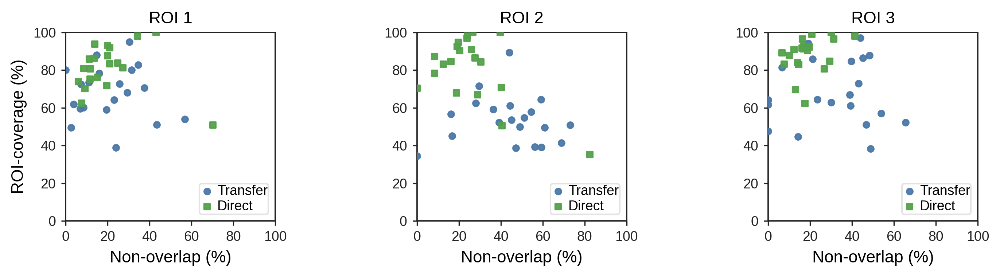

Saved: /content/Figure_ROI1-3_NO_vs_ROI_matchTime.png
Saved: /content/Figure_ROI1-3_NO_vs_ROI_matchTime_600dpi.tif


Button(description='Download 600 dpi TIFF', style=ButtonStyle())

In [ ]:
# SUPPLEMENTAL FIGURE 3

# Matches the Time (sec) figure in positions, dimensions, fonts, spacing.

import io, re, os, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from IPython.display import display
try:
    from google.colab import files
    import ipywidgets as widgets
    _IS_COLAB = True
except Exception:
    _IS_COLAB = False

# ===== CONFIG (identical canvas/settings to Time figure) =====
PANEL_SIZE = (3.1, 2.5)                 # per-panel width, height (inches)
DPI_PNG    = 300
DPI_TIF    = 600
OUT_DIR    = "/content"
PNG_PATH   = os.path.join(OUT_DIR, "Figure_ROI1-3_NO_vs_ROI_matchTime.png")
TIF_PATH   = os.path.join(OUT_DIR, "Figure_ROI1-3_NO_vs_ROI_matchTime_600dpi.tif")
ROIS_WANTED = [1, 2, 3]

# Colors (same defaults you’ve been using)
COL_TRANSFER = globals().get("COL_TRANSFER", "#4C78A8")
COL_DIRECT   = globals().get("COL_DIRECT",   "#54A24B")

# Fonts / axes (match Time figure)
rcParams["font.family"] = "sans-serif"
rcParams["font.sans-serif"] = ["Arial", "Liberation Sans"]
rcParams["axes.edgecolor"] = "#222222"
rcParams["axes.linewidth"] = 0.9
rcParams["axes.titlesize"] = 11
rcParams["axes.titleweight"] = "normal"
rcParams["xtick.direction"] = "out"
rcParams["ytick.direction"] = "out"

# ---------- Load ROIs sheet (multi-index header) ----------
if "uploaded" not in globals() or not len(uploaded):
    raise RuntimeError("No uploaded workbook found. Re-run the upload cell to populate `uploaded`.")

xlsx_name, xlsx_bytes = next(iter(uploaded.items()))
xls = pd.ExcelFile(io.BytesIO(xlsx_bytes))
roi_sheet = next((s for s in xls.sheet_names if "roi" in s.strip().lower()), None)
if roi_sheet is None:
    raise RuntimeError("Could not find a sheet with 'ROI' in its name.")
df = pd.read_excel(io.BytesIO(xlsx_bytes), sheet_name=roi_sheet, header=[0,1])

# ---------- Identify participant column ----------
pid_candidates = [c for c in df.columns
                  if isinstance(c[0], str) and c[0].strip().lower().startswith("participant")]
if not pid_candidates:
    raise RuntimeError("Participant ID column not found on ROI sheet.")
pid_col = pid_candidates[0]

df_part = df[~df[pid_col].isna()].copy()
df_part[pid_col] = pd.to_numeric(df_part[pid_col], errors="coerce").astype("Int64")

# ---------- Extract blocks (Transfer/Test vs Direct/Control) → tidy ----------
def extract_block(block_name):
    recs = []
    roi_indices = sorted({int(m.group(1)) for top, sub in df.columns
                          if top == block_name and (m:=re.search(r"#\s*(\d+)", str(sub)))})
    for roi in roi_indices:
        cols = [c for c in df.columns if c[0]==block_name and re.search(fr"#\s*{roi}(?:\.|$)", str(c[1]))]

        def col_key(c):
            m = re.search(fr"#\s*{roi}(?:\.(\d+))?$", str(c[1]))
            return int(m.group(1)) if (m and m.group(1) is not None) else -1
        cols_sorted = sorted(cols, key=col_key)

        # read label row or fall back to subheaders
        label_row = None
        for i in range(3):
            r = df.iloc[i][cols_sorted]
            if r.astype(str).str.contains("N-O|O %|ROI %|Time", case=False, regex=True).any():
                label_row = r.astype(str).tolist(); break
        if label_row is None:
            label_row = [str(c[1]) for c in cols_sorted]

        def norm(v):
            v = v.strip()
            rep = {"N-O area":"NO_area","O area":"O_area","ROI area":"ROI_area",
                   "Time (s)":"Time_s","N-O %":"NO_pct","O %":"O_pct","ROI %":"ROI_pct"}
            if v in rep: return rep[v]
            v2 = v.lower().replace(" ", "")
            if v2 in ["n-o%","no%"]: return "NO_pct"
            if v2 == "o%":           return "O_pct"
            if v2 == "roi%":         return "ROI_pct"
            if "time" in v2 and "s" in v2: return "Time_s"
            return v

        key_map = dict(zip(cols_sorted, [norm(v) for v in label_row]))
        sub = df_part[[pid_col] + cols_sorted].copy()

        for _, row in sub.iterrows():
            rec = {"ParticipantID": int(row[pid_col]), "ROI": roi,
                   "Condition": "Transfer" if "Test" in block_name else "Direct"}
            for col in cols_sorted:
                k = key_map[col]
                try:
                    rec[k] = float(row[col])
                except Exception:
                    rec[k] = np.nan
            recs.append(rec)
    return pd.DataFrame.from_records(recs)

transfer = extract_block("Test ROI")
direct   = extract_block("Control ROI")
tidy = pd.concat([transfer, direct], ignore_index=True)

# convert fractional % to 0–100 if needed
for col in ["NO_pct","ROI_pct"]:
    if col in tidy and tidy[col].dropna().between(0,1).mean() > 0.5:
        tidy[col] = tidy[col]*100.0

# pick participants
if "common_ids" in globals() and len(common_ids):
    use_ids = sorted(set(common_ids))
else:
    valid = tidy.dropna(subset=["NO_pct","ROI_pct"])
    use_ids = sorted(valid["ParticipantID"].dropna().unique().tolist())

df_plot = tidy[(tidy["ROI"].isin(ROIS_WANTED)) & (tidy["ParticipantID"].isin(use_ids))].copy()

# ---------- Helper ----------
def add_scatter(ax, df_cond, label, marker, color):
    dfc = df_cond.dropna(subset=["NO_pct","ROI_pct"])
    if dfc.empty: return
    ax.scatter(dfc["NO_pct"], dfc["ROI_pct"],
               s=16, marker=marker, alpha=0.95,
               color=color, label=label, zorder=3)

# ---------- Build figure (same canvas as Time figure) ----------
fig, axes = plt.subplots(
    1, 3,
    figsize=(PANEL_SIZE[0]*3.2, PANEL_SIZE[1]),
    dpi=DPI_PNG
)

for ax, roi in zip(axes, ROIS_WANTED):
    ss = df_plot[df_plot["ROI"] == roi]
    add_scatter(ax, ss[ss["Condition"]=="Transfer"], "Transfer", "o", COL_TRANSFER)
    add_scatter(ax, ss[ss["Condition"]=="Direct"],   "Direct",   "s", COL_DIRECT)

    ax.set_title(f"ROI {roi}", fontsize=11)
    ax.set_xlabel("Non-overlap (%)", fontsize=11)
    if roi == ROIS_WANTED[0]:
        ax.set_ylabel("ROI-coverage (%)", fontsize=11)

    ax.set_xlim(0, 100); ax.set_xticks(np.arange(0, 101, 20))
    ax.set_ylim(0, 100); ax.set_yticks(np.arange(0, 101, 20))
    ax.tick_params(labelsize=9, width=0.8, length=3, colors="#222222")

    # boxed spines + square-ish panels just like the Time figure
    for s in ("top","right","bottom","left"):
        ax.spines[s].set_visible(True); ax.spines[s].set_linewidth(0.9); ax.spines[s].set_color("#222222")
    ax.set_box_aspect(0.9)      # same panel shape as the Time figure
    ax.margins(x=0.02, y=0.03)

    # per-panel legend (same look/placement)
    ax.legend(loc="lower right",
              frameon=True, framealpha=0.55, fontsize=9,
              borderpad=0.06, handletextpad=0.25,
              labelspacing=0.18, handlelength=1.0, columnspacing=0.5)

# align left y-labels and use same padding as Time figure
fig.align_ylabels(axes)
fig.tight_layout(pad=0.6)
plt.show()

# ---- Save + Download (same as Time figure) ----
fig.savefig(PNG_PATH, dpi=DPI_PNG, bbox_inches="tight")
fig.savefig(TIF_PATH, dpi=DPI_TIF, bbox_inches="tight",
            pil_kwargs={"compression": "tiff_lzw"})
print(f"Saved: {PNG_PATH}\nSaved: {TIF_PATH}")

if _IS_COLAB:
    btn = widgets.Button(description="Download 600 dpi TIFF", button_style="")
    def _on_click(_): files.download(TIF_PATH)
    btn.on_click(_on_click)
    display(btn)

/tmp/ipython-input-1719910159.py:57: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  H = H.where(H.applymap(lambda x: x.strip() != ""), np.nan)
/tmp/ipython-input-1719910159.py:63: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  Hn = H.applymap(lambda x: norm(x) if pd.notna(x) else x)


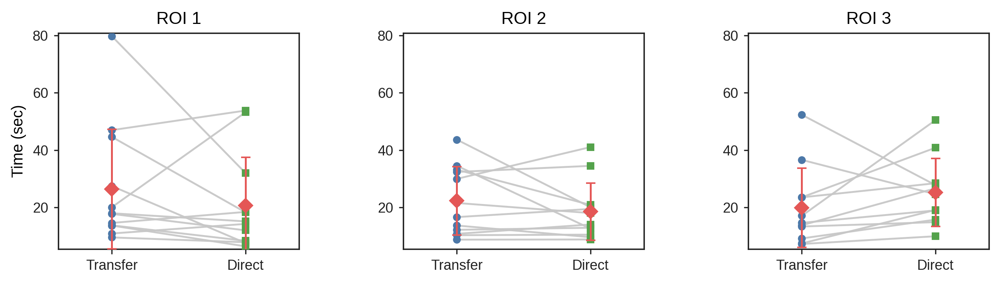

Saved: /content/Figure_ROI1-3_Time_sec.png
Saved: /content/Figure_ROI1-3_Time_sec_600dpi.tif


Button(description='Download 600 dpi TIFF', style=ButtonStyle())

In [ ]:
# SUPPLEMENTAL FIGURE 4

# === ROI Time (sec) • Same panel dimensions as reference • Robust ROIs parser ===
import io, re, os, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import ipywidgets as widgets
from IPython.display import display

# ===== CONFIG (matches your reference block) =====
PANEL_SIZE = (3.1, 2.5)                 # per-panel width, height (inches)
DPI_PNG    = 300
DPI_TIF    = 600
OUT_DIR    = "/content"
PNG_PATH   = os.path.join(OUT_DIR, "Figure_ROI1-3_Time_sec.png")
TIF_PATH   = os.path.join(OUT_DIR, "Figure_ROI1-3_Time_sec_600dpi.tif")
ROIS_WANTED = [1, 2, 3]

COL_TRANSFER = globals().get("COL_TRANSFER", "#4C78A8")
COL_DIRECT   = globals().get("COL_DIRECT",   "#54A24B")
COL_PAIR     = (0.78, 0.78, 0.78)
COL_DIAMOND  = "#E45756"

# Fonts (Arial like manuscript)
rcParams["font.family"] = "sans-serif"
rcParams["font.sans-serif"] = ["Arial", "Liberation Sans"]
rcParams["axes.edgecolor"] = "#222222"
rcParams["axes.linewidth"] = 0.9
rcParams["axes.titlesize"] = 11
rcParams["axes.titleweight"] = "normal"
rcParams["xtick.direction"] = "out"
rcParams["ytick.direction"] = "out"

# ===== Load ROIs sheet; handle merged headers =====
if "uploaded" not in globals() or not len(uploaded):
    raise RuntimeError("No uploaded workbook found. Re-run the upload cell to populate `uploaded`.")

xlsx_name, xlsx_bytes = next(iter(uploaded.items()))
xls = pd.ExcelFile(io.BytesIO(xlsx_bytes))
roi_sheet = next((s for s in xls.sheet_names if "roi" in s.strip().lower()), None)
if roi_sheet is None:
    raise RuntimeError("Could not find a sheet with 'ROI' in its name.")

raw = pd.read_excel(io.BytesIO(xlsx_bytes), sheet_name=roi_sheet, header=None)

def _trim_empty_edges(df):
    df = df.loc[:, ~df.isna().all(axis=0)]
    df = df.loc[~df.isna().all(axis=1)]
    return df.reset_index(drop=True)

raw = _trim_empty_edges(raw).copy()
raw.columns = list(range(raw.shape[1]))

# Build header stack for first rows (merged-aware)
HDR_ROWS = min(12, len(raw))
H = raw.iloc[:HDR_ROWS, :].astype(str)
H = H.where(H.applymap(lambda x: x.strip() != ""), np.nan)

def norm(s):
    s = re.sub(r"\s+", " ", str(s).strip())
    return s

Hn = H.applymap(lambda x: norm(x) if pd.notna(x) else x)

# Forward-fill ROI numbers across row bands
roi_num_pat = re.compile(r"\broi\b", re.I)
digit_pat   = re.compile(r"(?<!\d)[1-5](?!\d)")
roi_ff = pd.DataFrame(index=Hn.index, columns=Hn.columns)
for r in range(Hn.shape[0]):
    cur = None
    for c in range(Hn.shape[1]):
        cell = Hn.iat[r, c]
        if pd.notna(cell):
            m_num = digit_pat.search(cell)
            if roi_num_pat.search(cell) and m_num:
                cur = int(m_num.group(0))
            elif cur is None and m_num and not roi_num_pat.search(cell):
                left_txt = " ".join([str(x) for x in Hn.iloc[r, max(0,c-3):c].dropna().tolist()])
                if roi_num_pat.search(left_txt):
                    cur = int(m_num.group(0))
        roi_ff.iat[r, c] = cur

time_tok   = re.compile(r"(time|sec|secs|second|seconds|\(s\)|\bs\b)", re.I)
transfer_r = re.compile(r"\btrans?fer\b|\bT\b(?![a-z])", re.I)
direct_r   = re.compile(r"\bdirect\b|\bD\b(?![a-z])", re.I)

col_meta = []
for c in Hn.columns:
    stack = " | ".join([Hn.iat[r,c] for r in range(Hn.shape[0]) if pd.notna(Hn.iat[r,c])])
    votes = [roi_ff.iat[r,c] for r in range(Hn.shape[0]) if pd.notna(roi_ff.iat[r,c])]
    roi_vote = None
    if votes:
        vals = [v for v in votes if v in [1,2,3,4,5]]
        if vals:
            roi_vote = max(set(vals), key=vals.count)
    col_meta.append({
        "col_idx": c,
        "stack": stack,
        "roi_vote": roi_vote,
        "has_time": bool(time_tok.search(stack)),
        "has_transfer": bool(transfer_r.search(stack)),
        "has_direct": bool(direct_r.search(stack)),
    })
meta_df = pd.DataFrame(col_meta)

# First data row
def _first_data_row_idx(df, start=HDR_ROWS-1):
    for r in range(start, min(start+30, len(df))):
        vals = pd.to_numeric(df.iloc[r], errors="coerce")
        if np.isfinite(vals).sum() >= max(3, int(0.3*len(vals))):
            return r
    return start + 1

data_start = _first_data_row_idx(raw)
data = raw.iloc[data_start:].copy()
data.columns = list(range(data.shape[1]))  # use integer indices

# Participant ID column (heuristic: first mostly-numeric column)
pid_col = None
for c in data.columns:
    vals = pd.to_numeric(data[c], errors="coerce")
    if np.isfinite(vals).sum() >= max(5, int(0.5*len(vals))):
        pid_col = c; break
if pid_col is None: pid_col = 0
pid = pd.to_numeric(data[pid_col], errors="coerce").astype("Int64")

# Choose Transfer/Direct time columns per ROI
def choose_cols_for_roi(k):
    strict_T = meta_df[(meta_df["roi_vote"]==k) & meta_df["has_time"] & meta_df["has_transfer"]].sort_values("col_idx")
    strict_D = meta_df[(meta_df["roi_vote"]==k) & meta_df["has_time"] & meta_df["has_direct"]].sort_values("col_idx")
    T_col = int(strict_T.iloc[0]["col_idx"]) if len(strict_T) else None
    D_col = int(strict_D.iloc[0]["col_idx"]) if len(strict_D) else None
    if T_col is None or D_col is None:
        relaxed = meta_df[(meta_df["roi_vote"]==k) & meta_df["has_time"]].sort_values("col_idx")
        if len(relaxed) >= 2:
            if T_col is None: T_col = int(relaxed.iloc[0]["col_idx"])
            if D_col is None: D_col = int(relaxed.iloc[1]["col_idx"])
    if T_col == D_col and T_col is not None:
        cand = meta_df[(meta_df["has_time"]) & (~meta_df["col_idx"].isin([T_col]))].sort_values("col_idx")
        if len(cand): D_col = int(cand.iloc[0]["col_idx"])
    return T_col, D_col

roi_cols = {}
for k in ROIS_WANTED:
    Tcol, Dcol = choose_cols_for_roi(k)
    if Tcol is not None and Dcol is not None and Tcol != Dcol:
        roi_cols[k] = (Tcol, Dcol)
if not roi_cols:
    raise RuntimeError("Could not detect distinct Transfer/Direct time columns on the ROIs sheet.")

# Build tidy (ParticipantID, ROI, Condition, Time_s)
rows = []
for k, (t_idx, d_idx) in roi_cols.items():
    Tv = pd.to_numeric(data[t_idx], errors="coerce")
    Dv = pd.to_numeric(data[d_idx], errors="coerce")
    for p, v in zip(pid, Tv):
        if pd.isna(p) or pd.isna(v): continue
        rows.append({"ParticipantID": int(p), "ROI": k, "Condition": "Transfer", "Time_s": float(v)})
    for p, v in zip(pid, Dv):
        if pd.isna(p) or pd.isna(v): continue
        rows.append({"ParticipantID": int(p), "ROI": k, "Condition": "Direct", "Time_s": float(v)})
tidy = pd.DataFrame(rows)

# Pivots + y-lims
pivots, all_vals = {}, []
for roi in ROIS_WANTED:
    sub = tidy[tidy["ROI"]==roi].copy()
    piv = sub.pivot(index="ParticipantID", columns="Condition", values="Time_s").dropna(subset=["Transfer","Direct"])
    pivots[roi] = piv
    if not piv.empty:
        all_vals += piv["Transfer"].tolist() + piv["Direct"].tolist()
y_min, y_max = (max(0, np.nanmin(all_vals)-1), np.nanmax(all_vals)+1) if all_vals else (0, 1)

# ===== Plot (dimensions identical to your reference) =====
fig, axes = plt.subplots(
    1, len(ROIS_WANTED),
    figsize=(PANEL_SIZE[0]*3.2, PANEL_SIZE[1]),  # <-- same as reference
    dpi=DPI_PNG
)

if len(ROIS_WANTED) == 1:
    axes = [axes]

def _mean_sd(y):
    y = np.asarray(y, float); y = y[np.isfinite(y)]
    if y.size == 0: return np.nan, 0.0
    return y.mean(), (y.std(ddof=1) if y.size>1 else 0.0)

for ax, roi in zip(axes, ROIS_WANTED):
    piv = pivots.get(roi)
    ax.set_title(f"ROI {roi}", fontsize=11)
    for s in ("top","right","bottom","left"):
        ax.spines[s].set_visible(True); ax.spines[s].set_linewidth(0.9); ax.spines[s].set_color("#222222")

    if piv is None or piv.empty:
        ax.text(0.5, 0.5, "No paired data", ha="center", va="center")
        ax.set_xticks([0,1]); ax.set_xticklabels(["Transfer","Direct"])
        if roi == ROIS_WANTED[0]: ax.set_ylabel("Time (sec)")
        ax.set_ylim(y_min, y_max)
        continue

    # paired connectors + points
    for _, r in piv.iterrows():
        ax.plot([0,1], [r["Transfer"], r["Direct"]], color=COL_PAIR, lw=1.2, alpha=0.95, zorder=1)
        ax.plot([0], [r["Transfer"]], "o", ms=4, color=COL_TRANSFER, zorder=3)
        ax.plot([1], [r["Direct"]],   "s", ms=4, color=COL_DIRECT,   zorder=3)

    # mean ± SD diamonds
    for x, cond in enumerate(["Transfer","Direct"]):
        m, sd = _mean_sd(piv[cond].values)
        ax.errorbar([x], [m], yerr=[[sd],[sd]], fmt="D", ms=6,
                    color=COL_DIAMOND, ecolor=COL_DIAMOND, lw=1.2, capsize=3, zorder=5)

    ax.set_xlim(-0.4, 1.4); ax.set_ylim(y_min, y_max)
    ax.set_xticks([0,1]); ax.set_xticklabels(["Transfer","Direct"])
    if roi == ROIS_WANTED[0]:
        ax.set_ylabel("Time (sec)")
    ax.tick_params(labelsize=9, width=0.8, length=3, colors="#222222")
    ax.set_box_aspect(0.9)
    ax.margins(x=0.02, y=0.03)

fig.tight_layout(pad=0.6)
plt.show()

# ===== Save (PNG 300 dpi + TIFF 600 dpi) =====
fig.savefig(PNG_PATH, dpi=DPI_PNG, bbox_inches="tight")
fig.savefig(TIF_PATH, dpi=DPI_TIF, bbox_inches="tight", pil_kwargs={"compression": "tiff_lzw"})
print(f"Saved: {PNG_PATH}\nSaved: {TIF_PATH}")

# ===== Download button (manual click) =====
btn = widgets.Button(description="Download 600 dpi TIFF", button_style="")
def _on_click(_):
    from google.colab import files
    files.download(TIF_PATH)
btn.on_click(_on_click)
display(btn)


In [ ]:
# Statistical Analysis

import io
import pandas as pd
import numpy as np
from scipy import stats
from statsmodels.stats.anova import AnovaRM

# Load uploaded Excel file
uploaded_file = next(iter(uploaded.values()))
xls = pd.ExcelFile(io.BytesIO(uploaded_file))

# ======== COORDINATE DATA ANALYSIS ========
coords_df = xls.parse("Coordinates", skiprows=1)
coords_df.rename(columns={'Unnamed: 0': 'Participant ID'}, inplace=True)
coords_df = coords_df[coords_df['Participant ID'].apply(lambda x: str(x).isnumeric())]
coords_df['Participant ID'] = coords_df['Participant ID'].astype(int)
coords_df = coords_df[coords_df['Participant ID'] <= 22].copy()

# Define coordinate columns
transfer_err_cols  = [f"{i} (mm)" for i in range(1, 6)]
direct_err_cols    = [f"{i} (mm).1" for i in range(1, 6)]
transfer_time_cols = [f"{i} (sec)" for i in range(1, 6)]
direct_time_cols   = [f"{i} (sec).1" for i in range(1, 6)]

# Compute participant-wise means
coords_df['Err_mean_transfer']   = coords_df[transfer_err_cols].mean(axis=1)
coords_df['Err_mean_direct']     = coords_df[direct_err_cols].mean(axis=1)
coords_df['Time_mean_transfer']  = coords_df[transfer_time_cols].mean(axis=1)
coords_df['Time_mean_direct']    = coords_df[direct_time_cols].mean(axis=1)

# Paired t-tests with Cohen's d
dist_err_diff = coords_df['Err_mean_transfer'] - coords_df['Err_mean_direct']
t_err, p_err = stats.ttest_rel(coords_df['Err_mean_transfer'], coords_df['Err_mean_direct'])
d_err = dist_err_diff.mean() / dist_err_diff.std(ddof=1)

time_diff = coords_df['Time_mean_transfer'] - coords_df['Time_mean_direct']
t_time, p_time = stats.ttest_rel(coords_df['Time_mean_transfer'], coords_df['Time_mean_direct'])
d_time = time_diff.mean() / time_diff.std(ddof=1)

print(f"Distance Error:     t(21) = {t_err:.2f}, p = {p_err:.3f}, d = {d_err:.2f}")
print(f"Completion Time:    t(21) = {t_time:.2f}, p = {p_time:.3f}, d = {d_time:.2f}")

# ======== ROI DATA ANALYSIS (FLEXIBLE PARSING + NUMERIC FIXES) ========
rois_df = xls.parse("ROIs", header=[0,1,2])
rois_df.columns = [' '.join(filter(lambda x: isinstance(x, str) and x, col)).strip() for col in rois_df.columns]

# DEBUG: Print column names to verify structure
print("Available columns in ROI sheet:\n", rois_df.columns.tolist())

# Identify participant ID column
id_col = next(c for c in rois_df.columns if "participant" in c.lower() and "id" in c.lower())
rois_df = rois_df[rois_df[id_col].apply(lambda x: str(x).isnumeric())]
rois_df[id_col] = rois_df[id_col].astype(int)
rois_df = rois_df[rois_df[id_col] <= 22].copy()

# Validate presence of expected ROI data
roi_check_col = next((c for c in rois_df.columns if "transfer roi #1" in c.lower() and "n-o" in c.lower()), None)
if roi_check_col is None:
    raise ValueError("Could not find a column like 'Transfer ROI #1 N-O area'")
rois_df = rois_df.dropna(subset=[roi_check_col])

# Compute per-participant ROI averages
metrics = ["Time (s)", "N-O area", "O area", "N-O %", "ROI %"]
computed_metrics = []
for metric in metrics:
    transfer_cols = [col for col in rois_df.columns if "transfer roi" in col.lower() and metric.lower() in col.lower()]
    direct_cols   = [col for col in rois_df.columns if "direct roi" in col.lower() and metric.lower() in col.lower()]
    if transfer_cols and direct_cols:
        rois_df[f'{metric}__transfer_mean'] = rois_df[transfer_cols].mean(axis=1)
        rois_df[f'{metric}__direct_mean']   = rois_df[direct_cols].mean(axis=1)
        computed_metrics.append(metric)
    else:
        print(f"Warning: Could not find matching columns for {metric}")

# Run ROI paired tests
try:
    if "Time (s)" in computed_metrics:
        roi_time_diff = rois_df["Time (s)__transfer_mean"] - rois_df["Time (s)__direct_mean"]
        w_time, p_wtime = stats.wilcoxon(rois_df["Time (s)__transfer_mean"], rois_df["Time (s)__direct_mean"])
        print(f"ROI Drawing Time:   Wilcoxon Z = {w_time:.2f}, p = {p_wtime:.3f}")

    if "N-O %" in computed_metrics:
        rois_df["N-O %__transfer_mean"] = pd.to_numeric(rois_df["N-O %__transfer_mean"], errors='coerce')
        rois_df["N-O %__direct_mean"]   = pd.to_numeric(rois_df["N-O %__direct_mean"], errors='coerce')
        no_pct_diff = rois_df["N-O %__transfer_mean"] - rois_df["N-O %__direct_mean"]
        t_no, p_no = stats.ttest_rel(rois_df["N-O %__transfer_mean"], rois_df["N-O %__direct_mean"])
        d_no = no_pct_diff.mean() / no_pct_diff.std(ddof=1)
        print(f"Non-Overlap %:      t({len(rois_df)-1}) = {t_no:.2f}, p = {p_no:.3f}, d = {d_no:.2f}")

    if "ROI %" in computed_metrics:
        rois_df["ROI %__transfer_mean"] = pd.to_numeric(rois_df["ROI %__transfer_mean"], errors='coerce')
        rois_df["ROI %__direct_mean"]   = pd.to_numeric(rois_df["ROI %__direct_mean"], errors='coerce')
        roi_pct_diff = rois_df["ROI %__transfer_mean"] - rois_df["ROI %__direct_mean"]
        t_roi, p_roi = stats.ttest_rel(rois_df["ROI %__transfer_mean"], rois_df["ROI %__direct_mean"])
        d_roi = roi_pct_diff.mean() / roi_pct_diff.std(ddof=1)
        print(f"ROI Coverage %:     t({len(rois_df)-1}) = {t_roi:.2f}, p = {p_roi:.3f}, d = {d_roi:.2f}")
except Exception as e:
    print("Error in ROI paired tests:", e)

# ======== REPEATED-MEASURES ANOVA FOR DISTANCE ERROR ========
err_long = coords_df.melt(id_vars="Participant ID", value_vars=transfer_err_cols + direct_err_cols,
                          var_name="Condition", value_name="Error(mm)")
err_long = err_long.rename(columns={"Participant ID": "Participant_ID"})
err_long['Mode'] = np.where(err_long['Condition'].str.contains('.1'), 'Direct', 'Transfer')
err_long['Coordinate'] = err_long['Condition'].str.extract(r'(\d)')[0].astype(int)
err_long = err_long.sort_values(["Participant_ID", "Coordinate", "Mode"])

try:
    aov_err = AnovaRM(err_long, depvar="Error(mm)", subject="Participant_ID", within=["Mode", "Coordinate"]).fit()
    print("\nRepeated-Measures ANOVA: Distance Error")
    print(aov_err.summary())
except Exception as e:
    print("ANOVA Error:", e)

Distance Error:     t(21) = 3.62, p = 0.002, d = 0.77
Completion Time:    t(21) = 2.68, p = 0.014, d = 0.57
Available columns in ROI sheet:
 ['Participant ID Unnamed: 0_level_1 Unnamed: 0_level_2', 'Test ROI Transfer ROI #1 N-O area', 'Test ROI Transfer ROI #1 O area', 'Test ROI Transfer ROI #1 ROI area', 'Test ROI Transfer ROI #1 Time (s)', 'Test ROI Transfer ROI #1 N-O %', 'Test ROI Transfer ROI #1 O %', 'Test ROI Transfer ROI #1 ROI %', 'Test ROI Transfer ROI #2 N-O area', 'Test ROI Transfer ROI #2 O area', 'Test ROI Transfer ROI #2 ROI area', 'Test ROI Transfer ROI #2 Time (s)', 'Test ROI Transfer ROI #2 N-O %', 'Test ROI Transfer ROI #2 O %', 'Test ROI Transfer ROI #2 ROI %', 'Test ROI Transfer ROI #3 N-O area', 'Test ROI Transfer ROI #3 O area', 'Test ROI Transfer ROI #3 ROI area', 'Test ROI Transfer ROI #3 Time (s)', 'Test ROI Transfer ROI #3 N-O %', 'Test ROI Transfer ROI #3 O %', 'Test ROI Transfer ROI #3 ROI %', 'Control ROI Direct ROI #1 N-O area', 'Control ROI Direct ROI #1

In [9]:
import nbformat

path = "/content/drive/MyDrive/Vet AR Materials/Manuscript/Data/Data Analysis/Figures_Python.ipynb"

nb = nbformat.read(path, as_version=4)
changed = False

# --- 1. CLEAN CELL METADATA ---
for cell in nb.cells:
    if "widgets" in cell.get("metadata", {}):
        del cell.metadata["widgets"]
        changed = True

# --- 2. CLEAN TOP-LEVEL METADATA ---
if "widgets" in nb.metadata:
    del nb.metadata["widgets"]
    changed = True

# Sometimes widget metadata hides under this
if "application/vnd.jupyter.widget-state+json" in nb.metadata:
    del nb.metadata["application/vnd.jupyter.widget-state+json"]
    changed = True

# --- Save updated notebook ---
if changed:
    nbformat.write(nb, path)
    print("Widget metadata removed from notebook.")
else:
    print("No widget metadata found at cell or notebook level.")

Widget metadata removed from notebook.
